![](https://cap.img.pmdstatic.net/fit/https.3A.2F.2Fi.2Epmdstatic.2Enet.2Fcap.2F2021.2F12.2F15.2Fc18583b3-eed6-43f2-a7a0-b4580060081d.2Epng/1200x630/background-color/ffffff/focus-point/659%2C57/quality/70/cr/wqkgQ2hlc25vdCAvIEdldHR5IEltYWdlcyAvIENBUElUQUw%3D/airbnb-comment-la-mairie-de-paris-serre-encore-la-vis-dans-les-quartiers-touristiques-1423004.jpg)

# Business Problem

- What can we learn about different hosts and areas?

- What can we learn from predictions? (ex: locations, prices, reviews, etc)

- Which hosts are the busiest and why?

- Is there any noticeable difference of traffic among different areas and what could be the reason for it?

# Dataset Story

- Since 2008, guests and hosts have used Airbnb to expand on traveling possibilities and present more unique, personalized way of experiencing the world. This dataset describes the listing activity and metrics in NYC, NY for 2019.

- This data file includes all needed information to find out more about hosts, geographical availability, necessary metrics to make predictions and draw conclusions.

- The data contains 48895 rows and 16 columns.

- The data contains information about the id, host name, host_id, host_name, neighbourhood_group, neighbouhood, latitude, longitude, room type, price, minimum number of nights, number of reviews, last review, reviews per month, calculated host listings count, and availability during the year.

- **1. id: Unique ID of the Airbnb listing.**
- **2. name: Name of the listed property.**
- **3. host_id: Unique ID of the host.**
- **4. host_name: Name of the host.**
- **5. neighbourhood_group: General region of the location (neighborhood), e.g., Brooklyn, Manhattan, Queens, Staten Island, and Bronx.**
- **6. neighbourhood: Specific neighborhood where the property is located.**
- **7. latitude: Latitude coordinate of the property.**
- **8. longitude: Longitude coordinate of the property.**
- **9. room_type: Type of room (e.g., Private room, Shared room, Entire home/apt).**
- **10. price: Price per night (in USD).**
- **11. minimum_nights: Minimum number of nights guests are required to stay.**
- **12. number_of_reviews: Number of reviews the listing has received.**
- **13. last_review: Date of the last review.**
- **14. reviews_per_month: Average number of reviews per month.**
- **15. calculated_host_listings_count: Total number of properties listed by the host.**
- **16. availability_365: Number of days the property is available in a year.**

# Road Map

**1. Import Required Libraries**

**2. Adjusting Row Column Settings**

**3. Loading the data Set**

**4. Exploratory Data Analysis**

- **Visualizing Geographic Locations on an Interactive Map**

- **Heat Map of Geographic Distribution of Locations**

**5. Fill KNN Imputers**

**6. Capturing / Detecting Numeric and Categorical Variables**

**7. Analysis of Categorical Variables**

**8. Analysis of Numerical Variables**

**9. Analysis of Categorical Variables by Target**

**10. Analysis of Numeric Variables by Target**

**11. Correlation Analysis**

**12. Distribution of the Dependent Variable**

**13. Examining the Logarithm of the Dependent Variable**

- **Visualizing Location Data Based on Neighbourhood Group and Room Type**

- **Geographical Distribution of Prices**

- **Geographical Distribution of Availability**

- **Distribution by Neighbourhood Group**

- **Price Distribution by Room Type in Neighbourhood Groups**

- **Comparative Display of Median Monthly Reviews by Neighbourhood Group**

- **Comparison of Minimum Stay Nights by Neighbourhood Group**

- **Comparison of Number of Reviews by Neighbourhood Group**

- **Comparison of Host Listing Counts by Neighbourhood Group**

- **Comparison of Yearly Availability by Neighbourhood Group**

- **Comparison of Number of Reviews by Room Type**

- **Comparison of Monthly Reviews by Room Type**

- **Comparison of Host Listing Counts by Room Type**

- **Comparison of Yearly Availability by Room Type**

**14. Outliers Analysis**

**15. Missing Value Analysis**

**16. Rare Analysis**

**17. Feature Extraction**

**18. Encoding**

**19. Standardization Process**

**20. Creating Model**

**21. Hyperparameter optimization**

**22. Final Model Predictions and Comparison with True Prices**

**23. Feature Importance**

# 1. Import Required Libraries

In [1]:
pip install pandas-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 34.5 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.11.1
    Uninstalling scipy-1.11.1:
      Successfully uninstalled scipy-1.11.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
momepy 0.6.0 requires shapely>=2, but you have shapely 1.8.5.post1 which is incompatible.
pymc3 3.11.5 requires numpy<1.22.2,>=1.15.0, but you have numpy 1.23.5 which is incompatible.
pymc3 3.11.5 requires scipy<1.8.0,>=1.7.3, but you have scipy 1.10.1 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import time

from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.exceptions import ConvergenceWarning
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score,GridSearchCV
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, StandardScaler, RobustScaler
from sklearn.impute import KNNImputer
from sklearn import metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from pandas_profiling import ProfileReport

import folium
from folium.plugins import MarkerCluster
from folium import plugins
from folium.plugins import FastMarkerCluster
from folium.plugins import HeatMap


warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter("ignore", category=ConvergenceWarning)

<frozen importlib._bootstrap>:241: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
/opt/conda/lib/python3.10/site-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
/opt/conda/lib/python3.10/site-packages/visions/backends/shared/nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  

# 2. Adjusting Row Column Settings

In [3]:
pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# 3. Loading the data Set

In [4]:
df = pd.read_csv('/kaggle/input/new-york-city-airbnb-open-data/AB_NYC_2019.csv')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [6]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.647,-73.972,Private room,149,1,9,2018-10-19,0.210,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.754,-73.984,Entire home/apt,225,1,45,2019-05-21,0.380,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.809,-73.942,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.685,-73.960,Entire home/apt,89,1,270,2019-07-05,4.640,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.799,-73.944,Entire home/apt,80,10,9,2018-11-19,0.100,1,0


In [7]:
# We dropped the variables that we will not use from the data set.

drop_list = ['id', 'host_id', 'host_name', "last_review"]

In [8]:
df.drop(drop_list, axis=1, inplace=True)

In [9]:
df.head()

,name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,Clean & quiet apt home by the park,Brooklyn,Kensington,40.647,-73.972,Private room,149,1,9,0.210,6,365
1,Skylit Midtown Castle,Manhattan,Midtown,40.754,-73.984,Entire home/apt,225,1,45,0.380,2,355
2,THE VILLAGE OF HARLEM....NEW YORK !,Manhattan,Harlem,40.809,-73.942,Private room,150,3,0,NaN,1,365
3,Cozy Entire Floor of Brownstone,Brooklyn,Clinton Hill,40.685,-73.960,Entire home/apt,89,1,270,4.640,1,194
4,Entire Apt: Spacious Studio/Loft by central park,Manhattan,East Harlem,40.799,-73.944,Entire home/apt,80,10,9,0.100,1,0


# 4. Exploratory Data Analysis

In [10]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
# Preliminary examination of the data set

def check_df(dataframe, head=5):
    print('##################### Shape #####################')
    print(dataframe.shape)
    print('##################### Types #####################')
    print(dataframe.dtypes)
    print('##################### Head #####################')
    print(dataframe.head(head))
    print('##################### Tail #####################')
    print(dataframe.tail(head))
    print('##################### NA #####################')
    print(dataframe.isnull().sum())
    print('##################### Quantiles #####################')
    print(dataframe.describe([0, 0.05, 0.50, 0.95, 0.99, 1]).T)

check_df(df)

##################### Shape #####################
(48895, 12)
##################### Types #####################
name                               object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object
##################### Head #####################
                                               name neighbourhood_group  \
0                Clean & quiet apt home by the park            Brooklyn   
1                             Skylit Midtown Castle           Manhattan   
2               THE VILLAGE OF HARLEM....NEW YORK !           Manhattan   
3                   C

# Visualizing Geographic Locations on an Interactive Map

In [12]:
Long=-73.80
Lat=40.80

locations = list(zip(df.latitude, df.longitude))

map1 = folium.Map(location=[Lat,Long], zoom_start=9)

FastMarkerCluster(data=locations).add_to(map1)

map1

# Heat Map of Geographic Distribution of Locations

In [13]:
m=folium.Map([40.7128,-74.0060],zoom_start=11)

HeatMap(df[['latitude','longitude']].dropna(),radius=8,gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(m)

display(m)

# 5. Filled KNN Imputers

In [14]:
#df.fillna({'reviews_per_month':0}, inplace=True)

In [15]:
#df.head()

In [16]:
#df.isnull().sum()

In [17]:
dff = df[["reviews_per_month"]]

In [18]:
dff.head()

,reviews_per_month
0,0.210
1,0.380
2,NaN
3,4.640
4,0.100


In [19]:
rs = RobustScaler()

In [20]:
dff = pd.DataFrame(rs.fit_transform(dff), columns=dff.columns)

In [21]:
dff.head()

,reviews_per_month
0,-0.279
1,-0.186
2,NaN
3,2.142
4,-0.339


In [22]:
dff = pd.DataFrame(KNNImputer(n_neighbors=5).fit_transform(dff), columns = dff.columns)

In [23]:
dff.head()

,reviews_per_month
0,-0.279
1,-0.186
2,0.357
3,2.142
4,-0.339


In [24]:
dff = pd.DataFrame(rs.inverse_transform(dff), columns=dff.columns)

In [25]:
df[["reviews_per_month"]] = dff

In [26]:
df.head(10)

,name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,Clean & quiet apt home by the park,Brooklyn,Kensington,40.647,-73.972,Private room,149,1,9,0.210,6,365
1,Skylit Midtown Castle,Manhattan,Midtown,40.754,-73.984,Entire home/apt,225,1,45,0.380,2,355
2,THE VILLAGE OF HARLEM....NEW YORK !,Manhattan,Harlem,40.809,-73.942,Private room,150,3,0,1.373,1,365
3,Cozy Entire Floor of Brownstone,Brooklyn,Clinton Hill,40.685,-73.960,Entire home/apt,89,1,270,4.640,1,194
4,Entire Apt: Spacious Studio/Loft by central park,Manhattan,East Harlem,40.799,-73.944,Entire home/apt,80,10,9,0.100,1,0
5,Large Cozy 1 BR Apartment In Midtown East,Manhattan,Murray Hill,40.748,-73.975,Entire home/apt,200,3,74,0.590,1,129
6,BlissArtsSpace!,Brooklyn,Bedford-Stuyvesant,40.687,-73.956,Private room,60,45,49,0.400,1,0
7,Large Furnished Room Near B'way,Manhattan,Hell's Kitchen,40.765,-73.985,Private room,79,2,430,3.470,1,220
8,Cozy Clean Guest Room - Family Apt,Manhattan,Upper West Side,40.802,-73.967,Private room,79,2,118,0.990,1,0
9,Cute & Cozy Lower East Side 1 bdrm,Manhattan,Chinatown,40.713,-73.990,Entire home/apt,150,1,160,1.330,4,188


In [27]:
df.isnull().sum()

name                              16
neighbourhood_group                0
neighbourhood                      0
latitude                           0
longitude                          0
room_type                          0
price                              0
minimum_nights                     0
number_of_reviews                  0
reviews_per_month                  0
calculated_host_listings_count     0
availability_365                   0
dtype: int64

# 6. Capturing / Detecting Numeric and Categorical Variables

In [28]:
def grab_col_names(dataframe, cat_th=10, car_th=20):
    """

    Returns the names of categorical, numeric and categorical but cardinal variables in the data set.
    Note Categorical variables include categorical variables with numeric appearance.

    Parameters
    ------
        dataframe: dataframe
                Variable names of the dataframe to be taken
        cat_th: int, optional
                class threshold for numeric but categorical variables
        car_th: int, optinal
                class threshold for categorical but cardinal variables

    Returns
    ------
        cat_cols: list
                Categorical variable list
        num_cols: list
                Numeric variable list
        cat_but_car: list
                List of cardinal variables with categorical appearance

    Examples
    ------
        import seaborn as sns
        df = sns.load_dataset("iris")
        print(grab_col_names(df))


    Notes
    ------
        cat_cols + num_cols + cat_but_car = total number of variables
        num_but_cat is inside cat_cols.
        The sum of the 3 return lists equals the total number of variables: cat_cols + num_cols + cat_but_car = number of variables

    """

    # cat_cols, cat_but_car
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"] 

    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "O"]

    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == "O"]

    cat_cols = cat_cols + num_but_cat

    cat_cols = [col for col in cat_cols if col not in cat_but_car] 

    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"] 

    num_cols = [col for col in num_cols if col not in num_but_cat] 
    
    print(f"Observations: {dataframe.shape[0]}") 
    print(f"Variables: {dataframe.shape[1]}") 
    print(f'cat_cols: {len(cat_cols)}') 
    print(f'num_cols: {len(num_cols)}') 
    print(f'cat_but_car: {len(cat_but_car)}') 
    print(f'num_but_cat: {len(num_but_cat)}') 


    return cat_cols, num_cols, cat_but_car, num_but_cat

In [29]:
cat_cols, num_cols, cat_but_car,  num_but_cat = grab_col_names(df)

Observations: 48895
Variables: 12
cat_cols: 2
num_cols: 8
cat_but_car: 2
num_but_cat: 0


In [30]:
cat_cols

['neighbourhood_group', 'room_type']

In [31]:
num_cols

['latitude',
 'longitude',
 'price',
 'minimum_nights',
 'number_of_reviews',
 'reviews_per_month',
 'calculated_host_listings_count',
 'availability_365']

In [32]:
cat_but_car

['name', 'neighbourhood']

In [33]:
num_but_cat

[]

# 7. Analysis of Categorical Variables

In [34]:
def cat_summary(dataframe, col_name, plot=False):
    print(pd.DataFrame({col_name: dataframe[col_name].value_counts(),
                        'Ratio': 100 * dataframe[col_name].value_counts() / len(dataframe)}))
    print('##########################################')
    if plot:
        plt.figure(figsize=(12,6))
        sns.countplot(x=dataframe[col_name], data=dataframe)
        plt.show(block=True)

               neighbourhood_group  Ratio
Manhattan                    21661 44.301
Brooklyn                     20104 41.117
Queens                        5666 11.588
Bronx                         1091  2.231
Staten Island                  373  0.763
##########################################


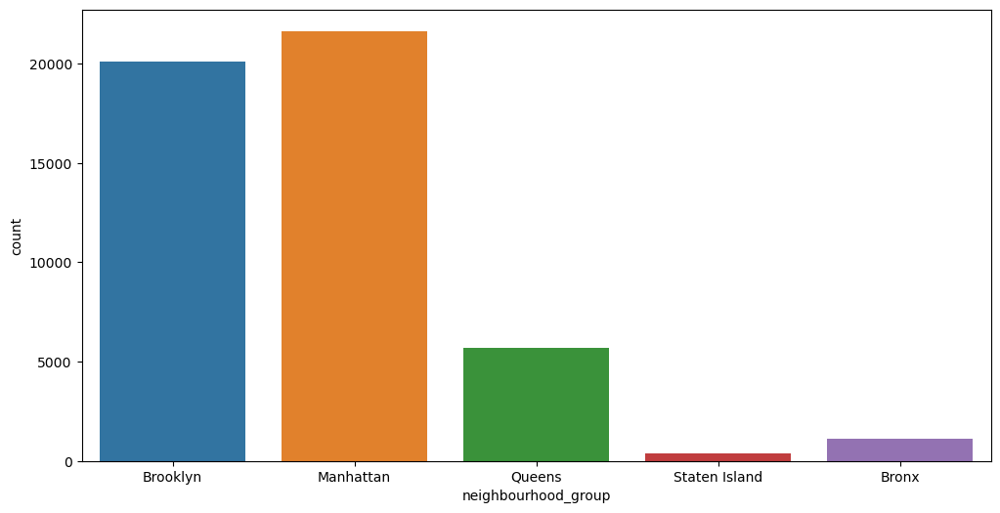

                 room_type  Ratio
Entire home/apt      25409 51.966
Private room         22326 45.661
Shared room           1160  2.372
##########################################


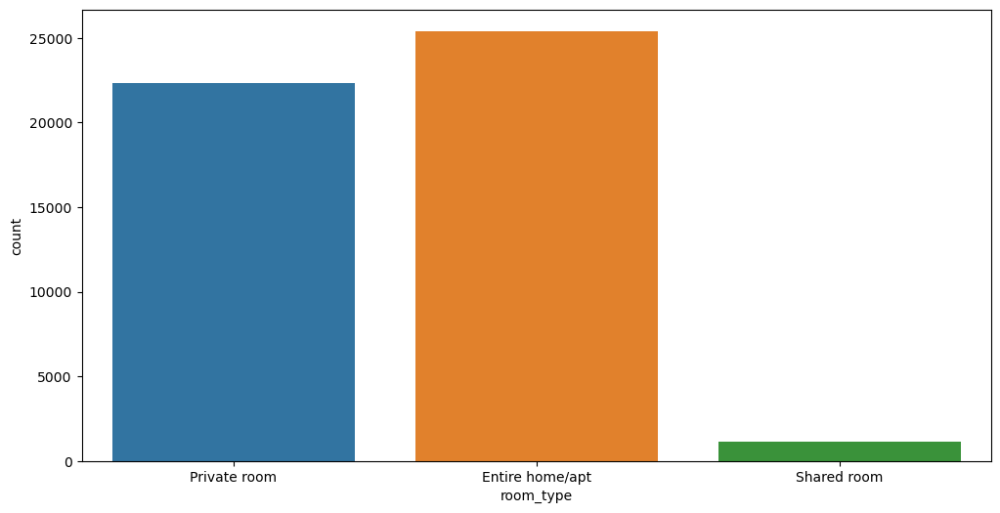

In [35]:
for col in cat_cols:
    cat_summary(df, col, plot=True)

# 8. Analysis of Numerical Variables

In [36]:
def num_summary(dataframe, numerical_col, plot=False):
    quantiles = [0.05, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 0.95, 0.99]
    print(dataframe[numerical_col].describe(quantiles).T)

    if plot:
        dataframe[numerical_col].hist(bins=20)
        
        plt.xlabel(numerical_col)
        plt.title(numerical_col)
        plt.show(block=True)

count   48895.000
mean       40.729
std         0.055
min        40.500
5%         40.646
10%        40.668
20%        40.685
30%        40.697
40%        40.712
50%        40.723
60%        40.738
70%        40.756
80%        40.771
90%        40.805
95%        40.826
99%        40.865
max        40.913
Name: latitude, dtype: float64


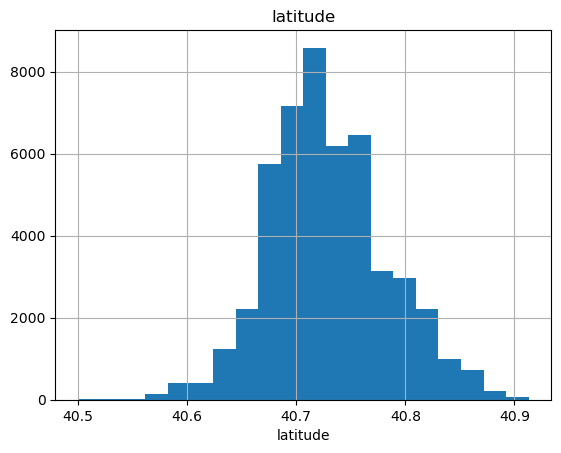

count   48895.000
mean      -73.952
std         0.046
min       -74.244
5%        -74.004
10%       -73.997
20%       -73.987
30%       -73.979
40%       -73.964
50%       -73.956
60%       -73.949
70%       -73.941
80%       -73.928
90%       -73.908
95%       -73.866
99%       -73.777
max       -73.713
Name: longitude, dtype: float64


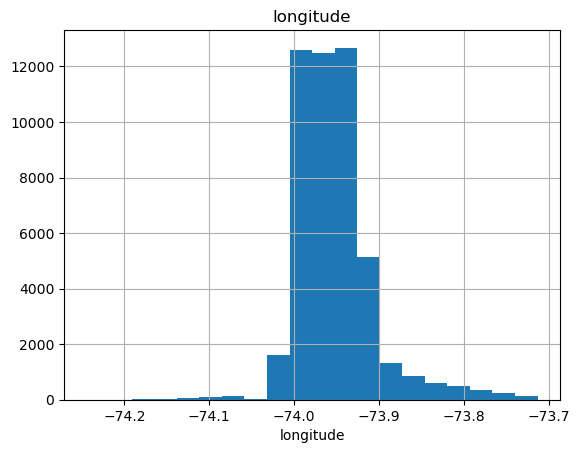

count   48895.000
mean      152.721
std       240.154
min         0.000
5%         40.000
10%        49.000
20%        60.000
30%        75.000
40%        90.000
50%       106.000
60%       130.000
70%       155.000
80%       200.000
90%       269.000
95%       355.000
99%       799.000
max     10000.000
Name: price, dtype: float64


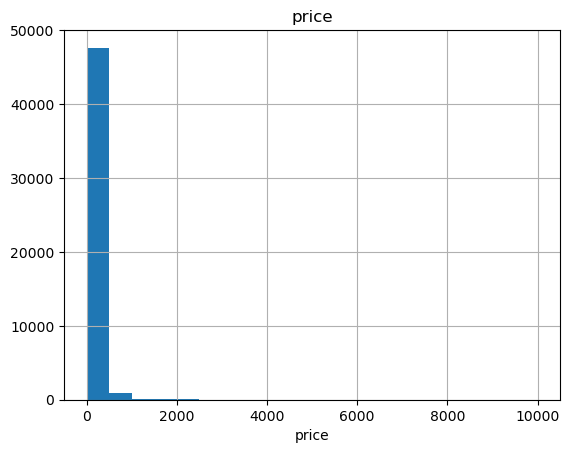

count   48895.000
mean        7.030
std        20.511
min         1.000
5%          1.000
10%         1.000
20%         1.000
30%         2.000
40%         2.000
50%         3.000
60%         3.000
70%         4.000
80%         6.000
90%        28.000
95%        30.000
99%        45.000
max      1250.000
Name: minimum_nights, dtype: float64


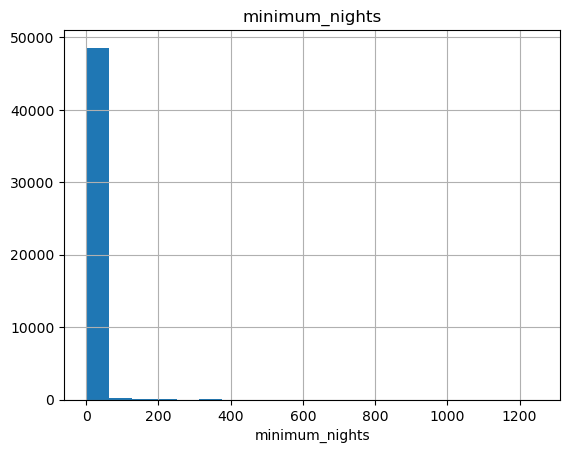

count   48895.000
mean       23.274
std        44.551
min         0.000
5%          0.000
10%         0.000
20%         0.000
30%         1.000
40%         3.000
50%         5.000
60%         9.000
70%        17.000
80%        33.000
90%        70.000
95%       114.000
99%       214.000
max       629.000
Name: number_of_reviews, dtype: float64


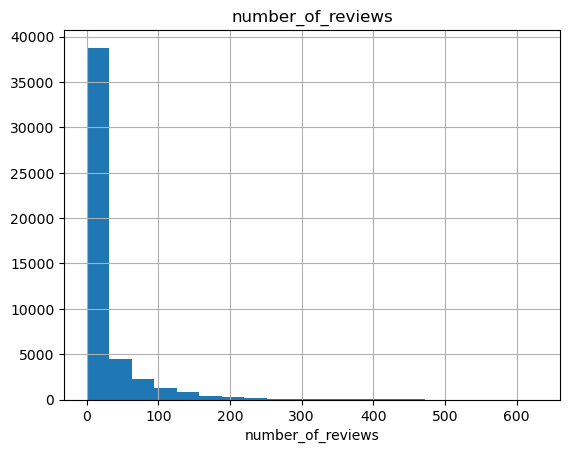

count   48895.000
mean        1.373
std         1.498
min         0.010
5%          0.050
10%         0.080
20%         0.190
30%         0.390
40%         0.730
50%         1.220
60%         1.373
70%         1.373
80%         2.000
90%         3.250
95%         4.310
99%         6.800
max        58.500
Name: reviews_per_month, dtype: float64


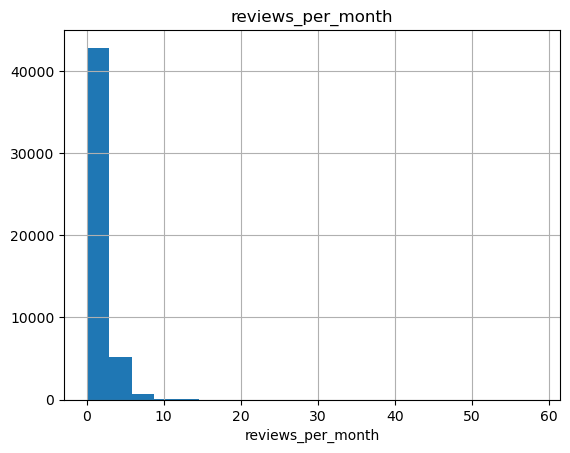

count   48895.000
mean        7.144
std        32.953
min         1.000
5%          1.000
10%         1.000
20%         1.000
30%         1.000
40%         1.000
50%         1.000
60%         1.000
70%         2.000
80%         3.000
90%         5.000
95%        15.000
99%       232.000
max       327.000
Name: calculated_host_listings_count, dtype: float64


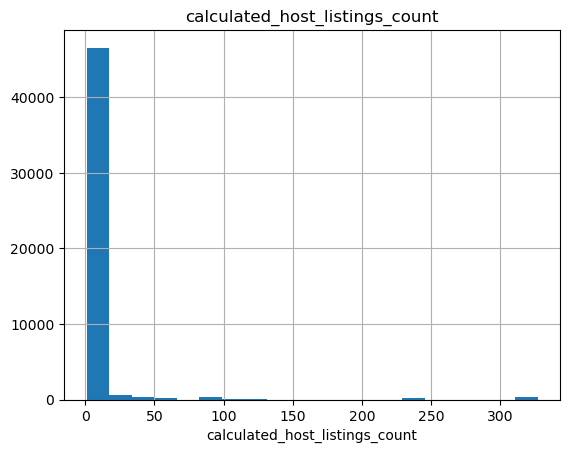

count   48895.000
mean      112.781
std       131.622
min         0.000
5%          0.000
10%         0.000
20%         0.000
30%         0.000
40%         8.000
50%        45.000
60%        92.000
70%       179.000
80%       272.000
90%       337.000
95%       359.000
99%       365.000
max       365.000
Name: availability_365, dtype: float64


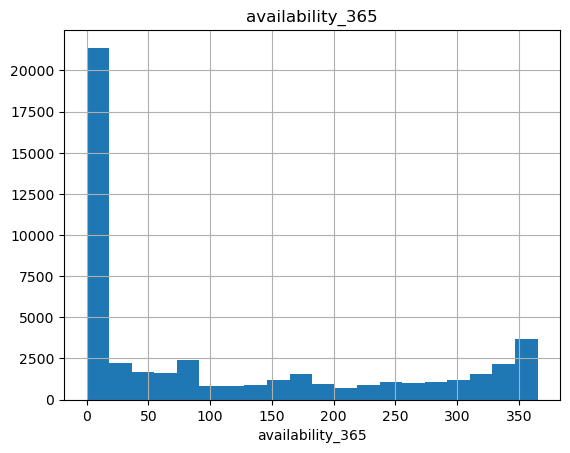

In [37]:
for col in num_cols:
    num_summary(df, col, plot=True)

# 9. Analysis of Categorical Variables by Target

In [38]:
def target_summary_with_cat(dataframe, target, categorical_col, plot=False):
    print(pd.DataFrame({'TARGET_MEAN': dataframe.groupby(categorical_col)[target].mean()}), end='\n\n\n')
    if plot:
        sns.barplot(x=categorical_col, y=target, data=dataframe)
        plt.show(block=True)

                     TARGET_MEAN
neighbourhood_group             
Bronx                     87.497
Brooklyn                 124.383
Manhattan                196.876
Queens                    99.518
Staten Island            114.812




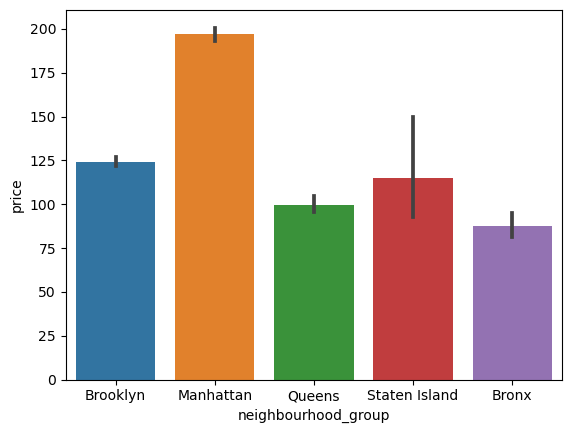

                 TARGET_MEAN
room_type                   
Entire home/apt      211.794
Private room          89.781
Shared room           70.128




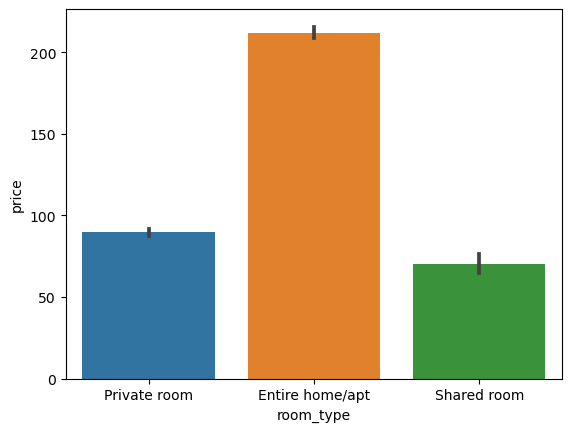

In [39]:
for col in cat_cols:
    target_summary_with_cat(df, 'price', col, plot=True)

# 10. Analysis of Numeric Variables by Target

In [40]:
def target_summary_with_num(dataframe, target, numerical_col, plot=False):
    print(pd.DataFrame({numerical_col+'_mean': dataframe.groupby(target)[numerical_col].mean()}), end='\n\n\n')
    if plot:
        sns.barplot(x=target, y=numerical_col, data=dataframe)
        plt.show(block=True)

In [41]:
for col in num_cols:
    target_summary_with_cat(df, 'price', col, plot=False)

          TARGET_MEAN
latitude             
40.500        110.000
40.506         75.000
40.507        100.000
40.509        299.000
40.509         85.000
...               ...
40.908         53.000
40.912         40.000
40.912         50.000
40.912         40.000
40.913         40.000

[19048 rows x 1 columns]


           TARGET_MEAN
longitude             
-74.244         70.000
-74.243        100.000
-74.241        110.000
-74.240        299.000
-74.239         85.000
...                ...
-73.719         32.000
-73.718        180.000
-73.718         42.000
-73.717        240.000
-73.713         65.000

[14718 rows x 1 columns]


       TARGET_MEAN
price             
0            0.000
10          10.000
11          11.000
12          12.000
13          13.000
...            ...
7703      7703.000
8000      8000.000
8500      8500.000
9999      9999.000
10000    10000.000

[674 rows x 1 columns]


                TARGET_MEAN
minimum_nights             
1                   142.023
2 

# 11. Correlation Analysis

In [42]:
def high_correlated_cols(dataframe, plot=False, corr_th=0.70):
    corr = dataframe.corr()
    cor_matrix = corr.abs()
    upper_triangle_matrix = cor_matrix.where(np.triu(np.ones(cor_matrix.shape), k=1).astype(np.bool))
    drop_list = [col for col in upper_triangle_matrix.columns if any(upper_triangle_matrix[col] > corr_th)]
    if plot:
        import seaborn as sns
        import matplotlib.pyplot as plt
        sns.set(rc={'figure.figsize': (12, 12)})
        sns.heatmap(corr, cmap="RdBu", annot=True, fmt=".2f")  # annot=True added here
        plt.show()
    return drop_list

/tmp/ipykernel_20/3780640542.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper_triangle_matrix = cor_matrix.where(np.triu(np.ones(cor_matrix.shape), k=1).astype(np.bool))


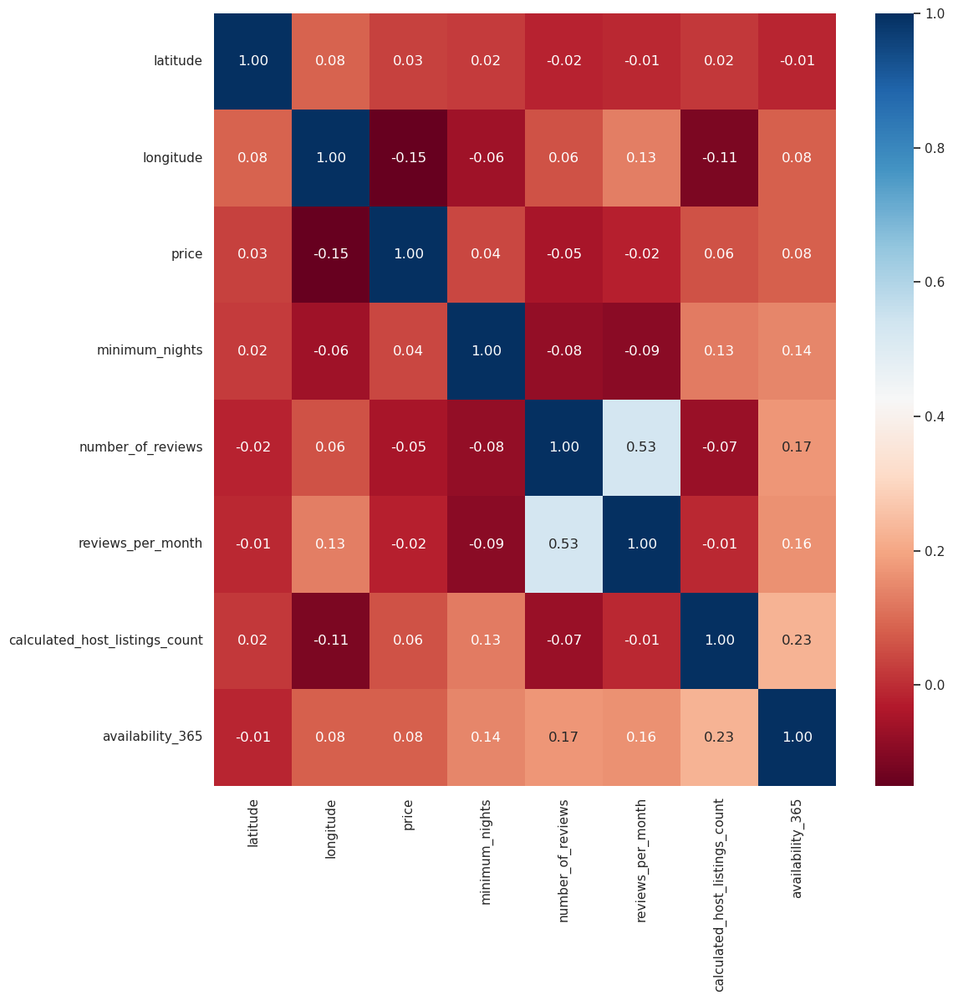

[]

In [43]:
high_correlated_cols(df, plot=True)

In [44]:
corr = df[num_cols].corr()

In [45]:
corr

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
latitude,1.000,0.085,0.034,0.025,-0.015,-0.009,0.020,-0.011
longitude,0.085,1.000,-0.150,-0.063,0.059,0.132,-0.115,0.083
price,0.034,-0.150,1.000,0.043,-0.048,-0.022,0.057,0.082
minimum_nights,0.025,-0.063,0.043,1.000,-0.080,-0.092,0.128,0.144
number_of_reviews,-0.015,0.059,-0.048,-0.080,1.000,0.530,-0.072,0.172
reviews_per_month,-0.009,0.132,-0.022,-0.092,0.530,1.000,-0.007,0.163
calculated_host_listings_count,0.020,-0.115,0.057,0.128,-0.072,-0.007,1.000,0.226
availability_365,-0.011,0.083,0.082,0.144,0.172,0.163,0.226,1.000


# 12. Distribution of the Dependent Variable

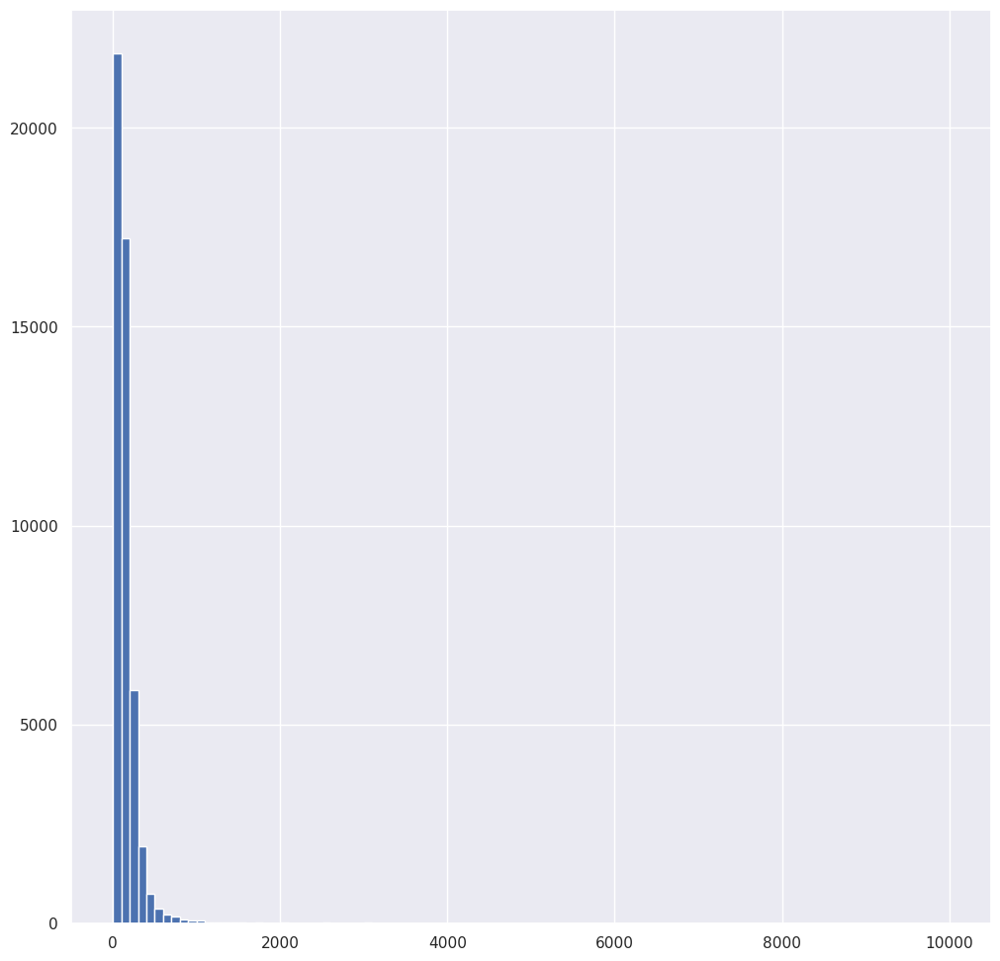

In [46]:
df["price"].hist(bins=100)
plt.show(block=True)

# 13. Examining the Logarithm of the Dependent Variable

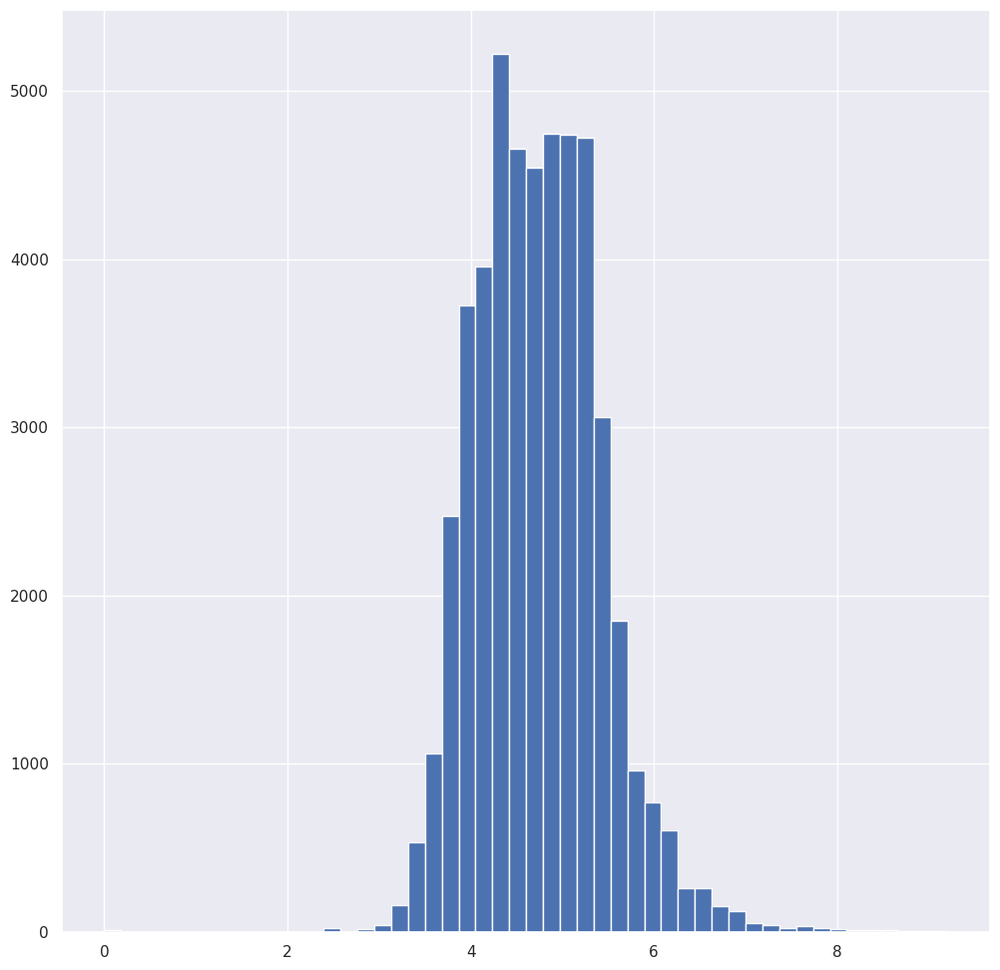

In [47]:
np.log1p(df['price']).hist(bins=50)
plt.show(block=True)

# Visualizing Location Data Based on Neighbourhood Group and Room Type

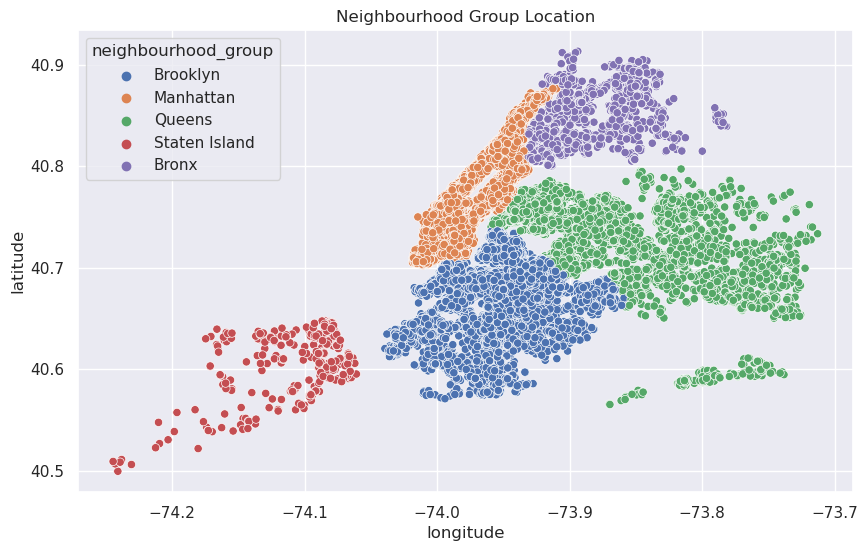

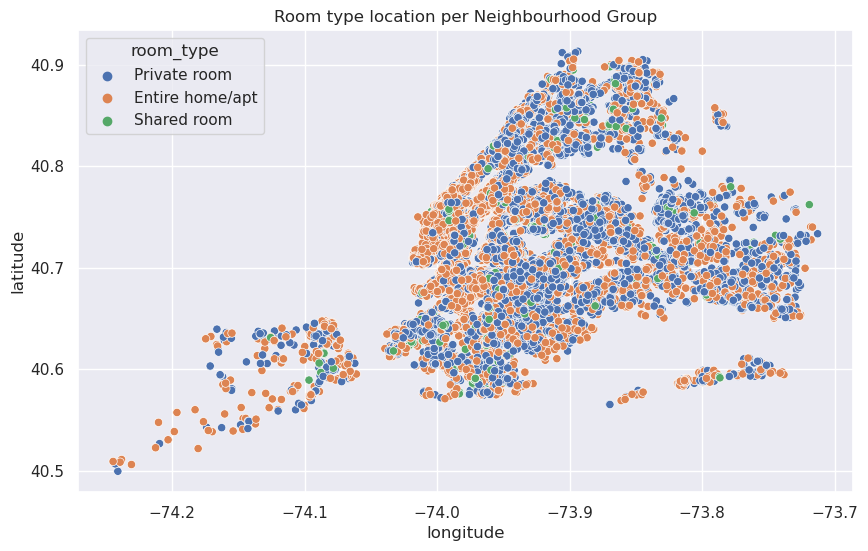

In [48]:
title = 'Neighbourhood Group Location'
plt.figure(figsize=(10,6))
sns.scatterplot(x='longitude', y='latitude', hue='neighbourhood_group', data=df).set_title(title)
plt.ioff()

title = 'Room type location per Neighbourhood Group'
plt.figure(figsize=(10,6))
sns.scatterplot(x='longitude', y='latitude', hue='room_type', data=df).set_title(title)
plt.ioff()


# Geographical Distribution of Prices

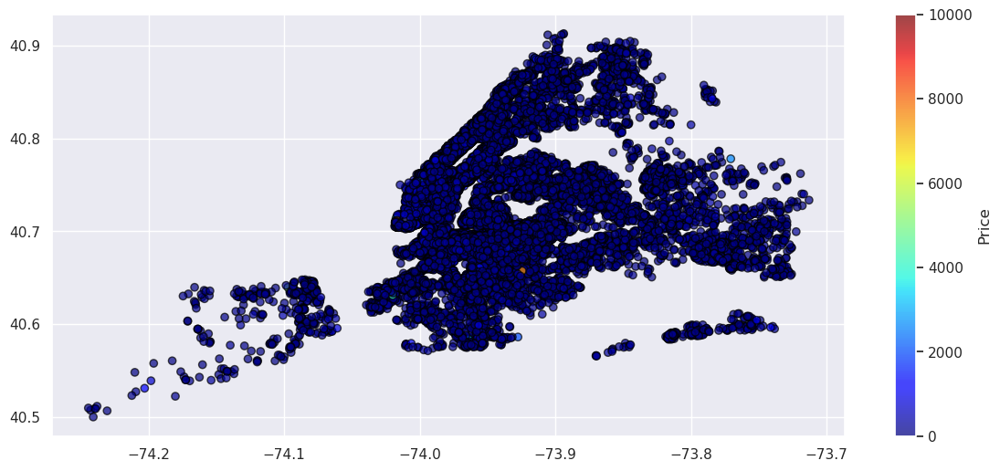

In [49]:
plt.figure(figsize= (14,6))
plt.scatter(df.longitude, df.latitude, c = df.price, alpha = 0.7, cmap ='jet',edgecolor = 'black')
cbar = plt.colorbar()
cbar.set_label('Price')
plt.show()

# Geographical Distribution of Availability

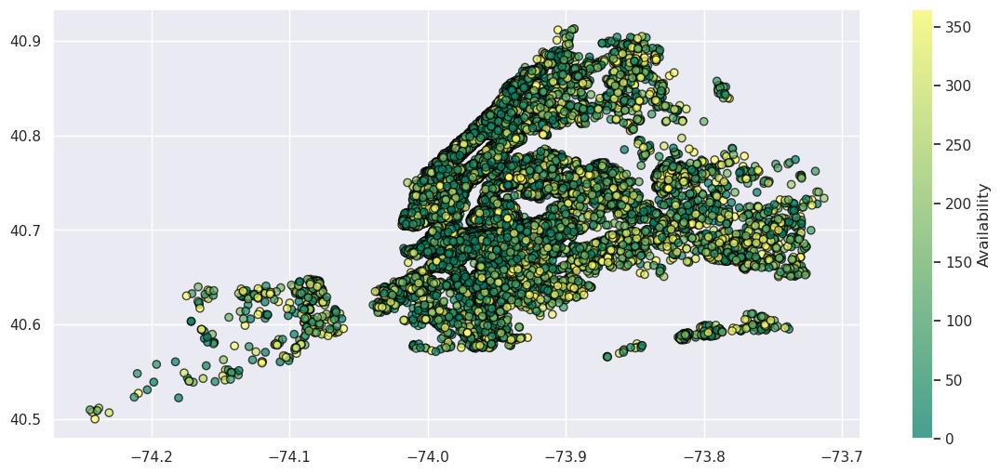

In [50]:
plt.figure(figsize= (14,6))
plt.scatter(df.longitude, df.latitude, c = df.availability_365, alpha = 0.7,cmap ='summer',edgecolor = 'black')
c_bar = plt.colorbar()
c_bar.set_label('Availability')
plt.show()

# Distribution by Neighbourhood Group

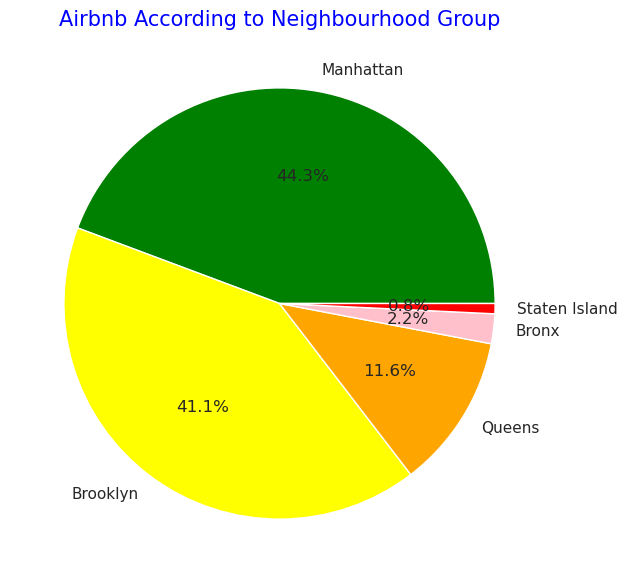

In [51]:
labels = df.neighbourhood_group.value_counts().index
colors = ['green','yellow','orange','pink','red']
explode = [0,0,0,0,0]
sizes = df.neighbourhood_group.value_counts().values

plt.figure(0,figsize = (7,7))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%')
plt.title('Airbnb According to Neighbourhood Group',color = 'blue',fontsize = 15)
plt.show()

# Price Distribution by Room Type in Neighbourhood Groups

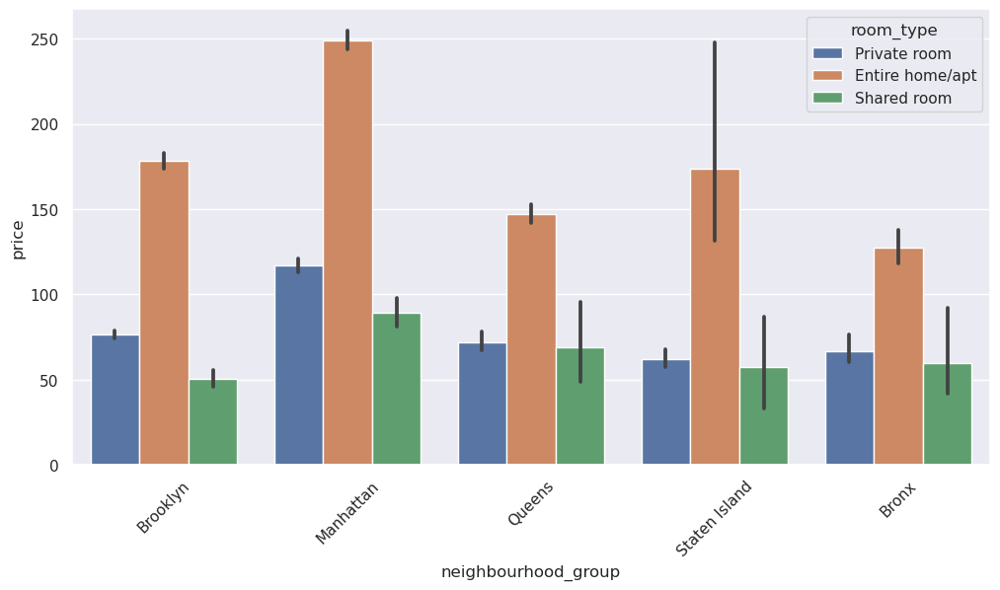

In [52]:
plt.figure(figsize=(12,6))
sns.barplot(x = "neighbourhood_group", y = "price", hue = "room_type", data = df)
plt.xticks(rotation=45)
plt.show()

# Comparative Display of Median Monthly Reviews by Neighbourhood Group

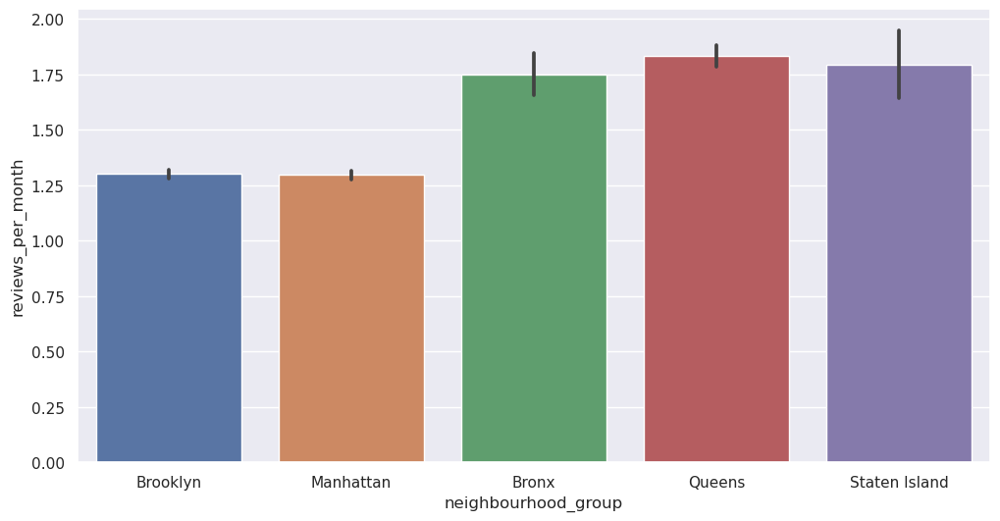

In [53]:
plt.figure(figsize=(12,6))

result = df.groupby(["neighbourhood_group"])['reviews_per_month'].aggregate(np.median).reset_index().sort_values('reviews_per_month')

sns.barplot(x='neighbourhood_group', y="reviews_per_month", data=df, order=result['neighbourhood_group'])

plt.show()

# Comparison of Minimum Stay Nights by Neighbourhood Group

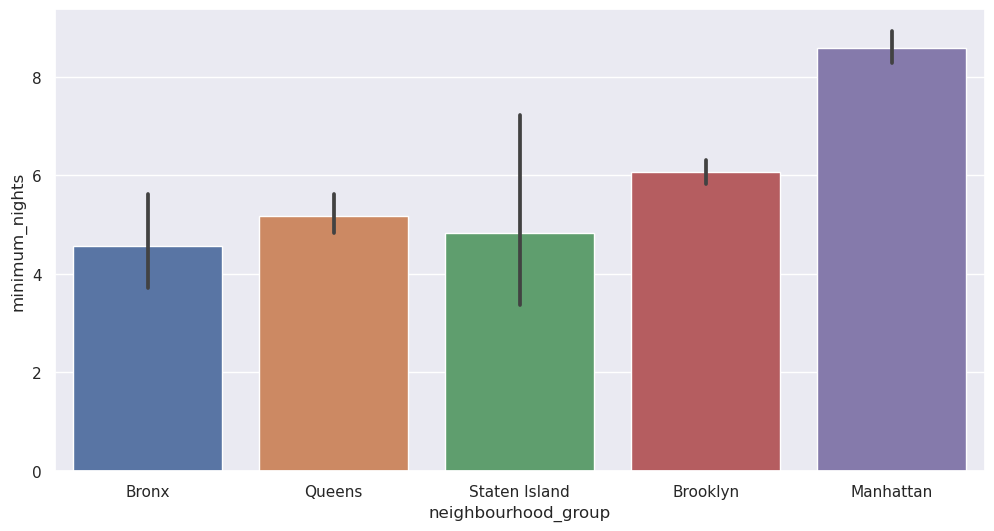

In [54]:
plt.figure(figsize=(12,6))

result = df.groupby(["neighbourhood_group"])['minimum_nights'].aggregate(np.median).reset_index().sort_values('minimum_nights')

sns.barplot(x='neighbourhood_group', y="minimum_nights", data=df, order=result['neighbourhood_group'])

plt.show()

# Comparison of Number of Reviews by Neighbourhood Group

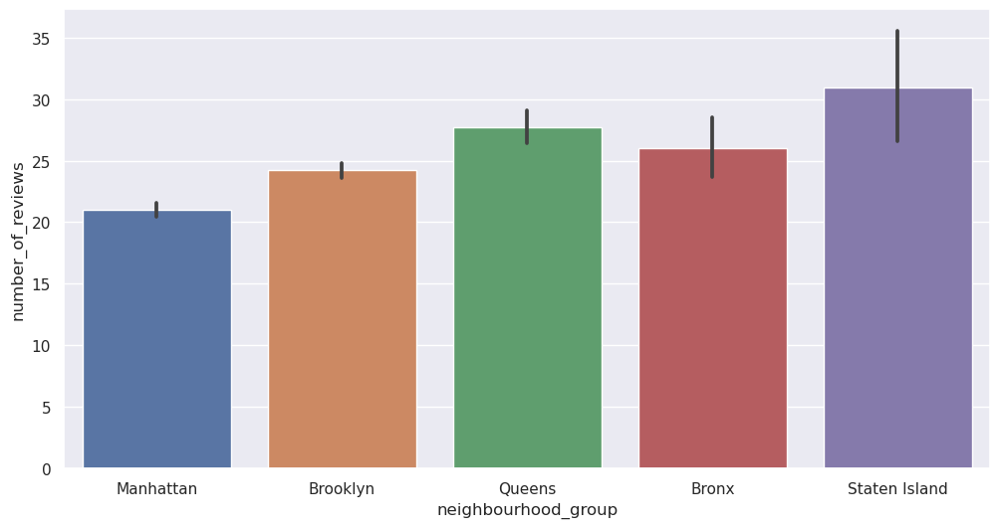

In [55]:
plt.figure(figsize=(12,6))

result = df.groupby(["neighbourhood_group"])['number_of_reviews'].aggregate(np.median).reset_index().sort_values('number_of_reviews')

sns.barplot(x='neighbourhood_group', y="number_of_reviews", data=df, order=result['neighbourhood_group'])

plt.show()

# Comparison of Host Listing Counts by Neighbourhood Group

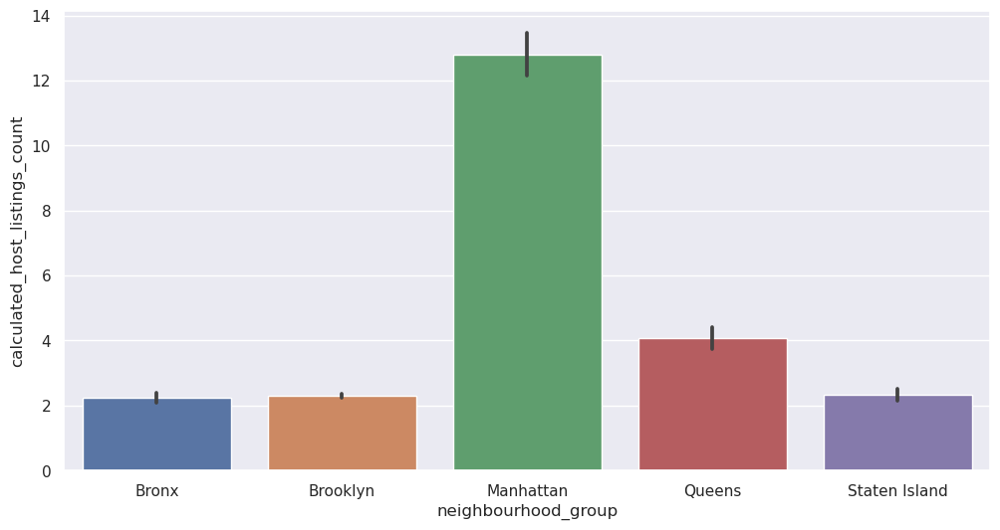

In [56]:
plt.figure(figsize=(12,6))

result = df.groupby(["neighbourhood_group"])['calculated_host_listings_count'].aggregate(np.median).reset_index().sort_values('calculated_host_listings_count')

sns.barplot(x='neighbourhood_group', y="calculated_host_listings_count", data=df, order=result['neighbourhood_group'])

plt.show()

# Comparison of Yearly Availability by Neighbourhood Group

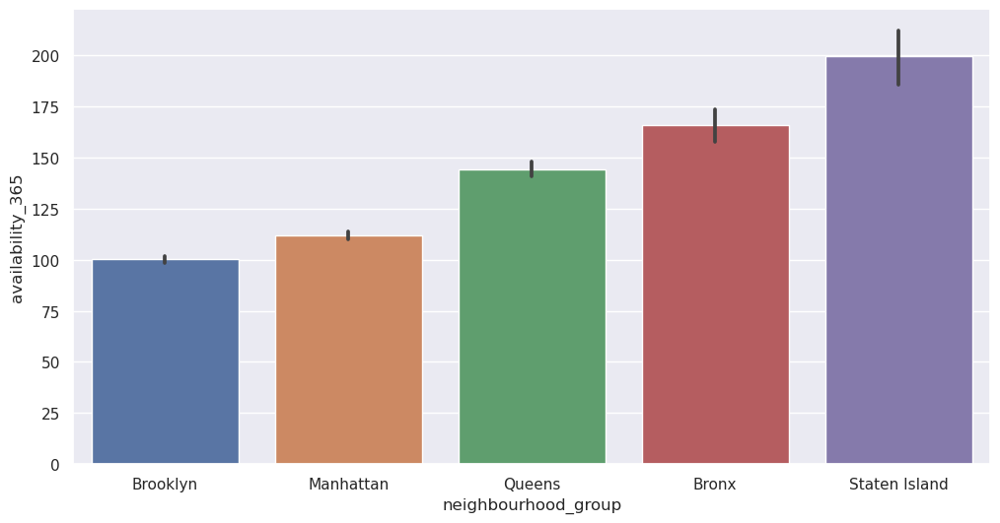

In [57]:
plt.figure(figsize=(12,6))

result = df.groupby(["neighbourhood_group"])['availability_365'].aggregate(np.median).reset_index().sort_values('availability_365')

sns.barplot(x='neighbourhood_group', y="availability_365", data=df, order=result['neighbourhood_group']) 

plt.show()

# Comparison of Number of Reviews by Room Type

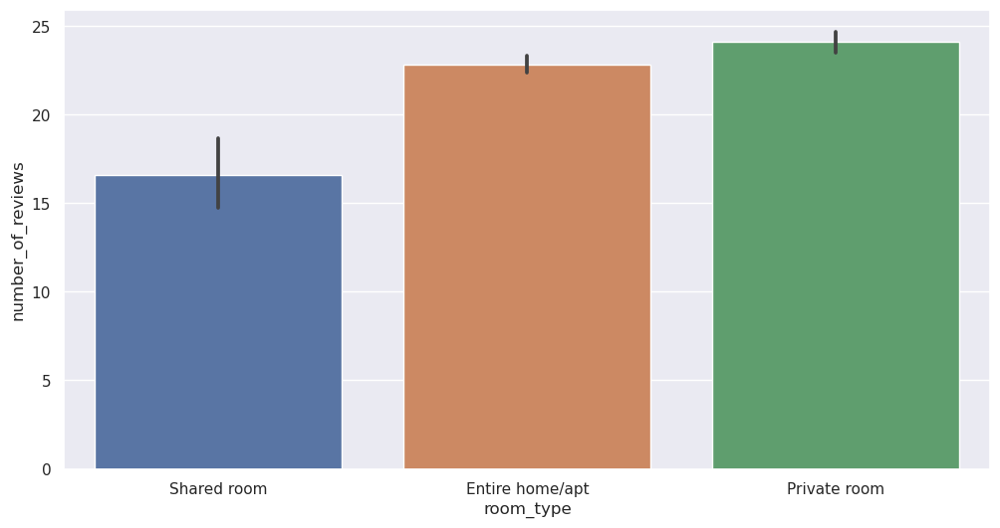

In [58]:
plt.figure(figsize=(12,6))

result = df.groupby(["room_type"])['number_of_reviews'].aggregate(np.median).reset_index().sort_values('number_of_reviews')

sns.barplot(x='room_type', y="number_of_reviews", data=df, order=result['room_type'])

plt.show()

# Comparison of Monthly Reviews by Room Type

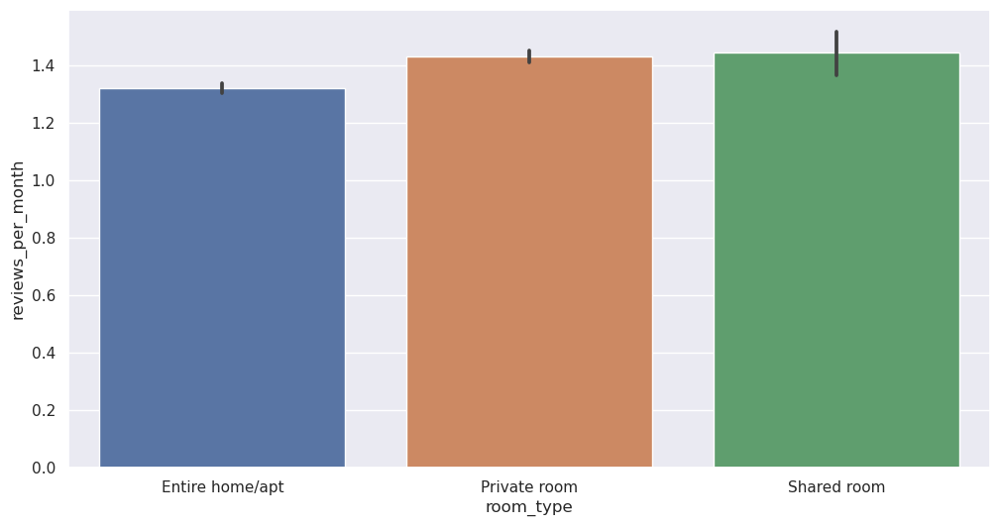

In [59]:
plt.figure(figsize=(12,6))

result = df.groupby(["room_type"])['reviews_per_month'].aggregate(np.median).reset_index().sort_values('reviews_per_month')

sns.barplot(x='room_type', y="reviews_per_month", data=df, order=result['room_type'])

plt.show()

# Comparison of Host Listing Counts by Room Type

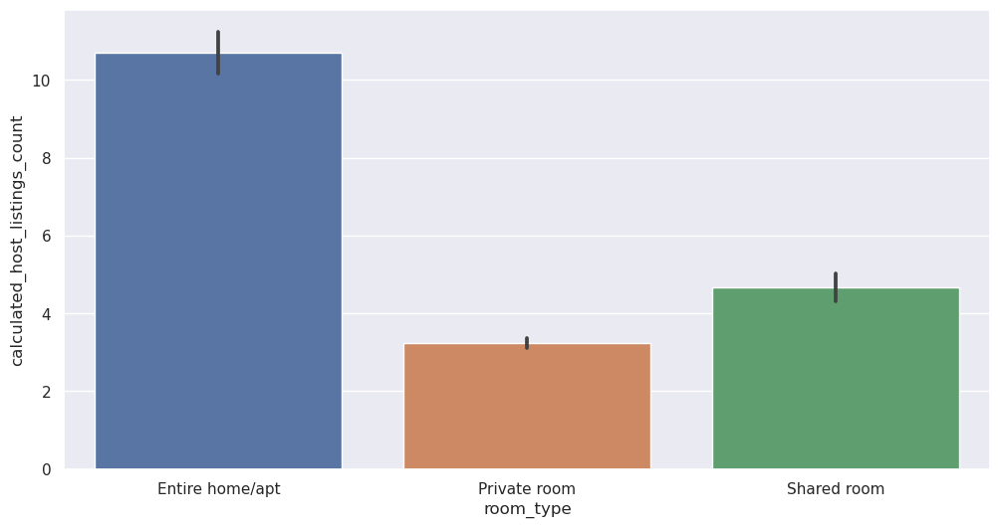

In [60]:
plt.figure(figsize=(12,6))

result = df.groupby(["room_type"])['calculated_host_listings_count'].aggregate(np.median).reset_index().sort_values('calculated_host_listings_count')

sns.barplot(x='room_type', y="calculated_host_listings_count", data=df, order=result['room_type'])

plt.show()

# Comparison of Yearly Availability by Room Type

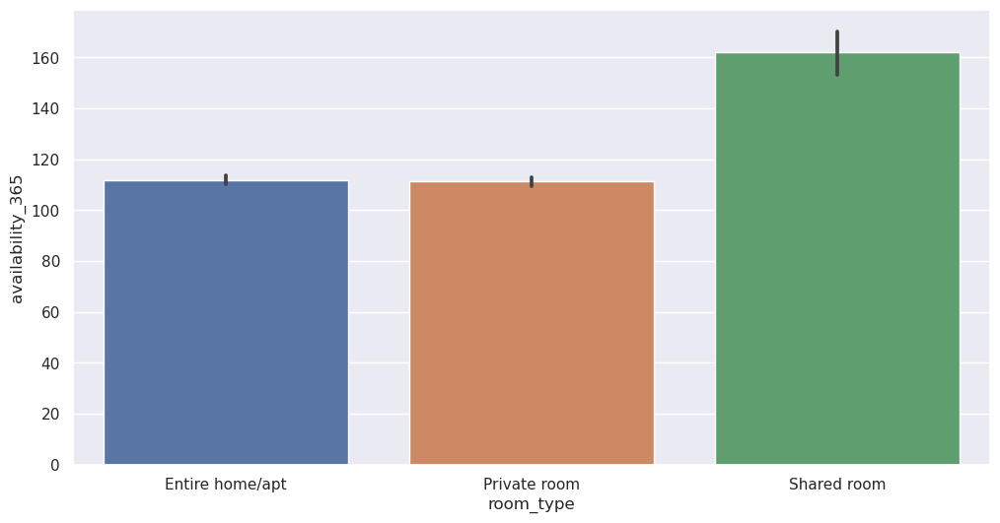

In [61]:
plt.figure(figsize=(12,6))

result = df.groupby(["room_type"])['availability_365'].aggregate(np.median).reset_index().sort_values('availability_365')

sns.barplot(x='room_type', y="availability_365", data=df, order=result['room_type'])

plt.show()

# 14. Outliers Analysis

In [62]:
# We dropped the variables that we will not use from the data set.

drop_list_2 = ['name', 'neighbourhood']

In [63]:
df.drop(drop_list_2, axis=1, inplace=True)

In [64]:
df.head()

,neighbourhood_group,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,Brooklyn,40.647,-73.972,Private room,149,1,9,0.210,6,365
1,Manhattan,40.754,-73.984,Entire home/apt,225,1,45,0.380,2,355
2,Manhattan,40.809,-73.942,Private room,150,3,0,1.373,1,365
3,Brooklyn,40.685,-73.960,Entire home/apt,89,1,270,4.640,1,194
4,Manhattan,40.799,-73.944,Entire home/apt,80,10,9,0.100,1,0


In [65]:
def outlier_thresholds(dataframe, col_name, q1=0.05, q3=0.95):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit

In [66]:
def check_outlier(dataframe, col_name):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
        return True
    else:
        return False

In [67]:
def replace_with_thresholds(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

In [68]:
for col in num_cols:
    print(col, check_outlier(df, col))

latitude False
longitude True
price True
minimum_nights True
number_of_reviews True
reviews_per_month True
calculated_host_listings_count True
availability_365 False


In [69]:
for col in num_cols:
    if check_outlier(df, col):
        replace_with_thresholds(df, col)

In [70]:
for col in num_cols:
    print(col, check_outlier(df, col))

latitude False
longitude False
price False
minimum_nights False
number_of_reviews False
reviews_per_month False
calculated_host_listings_count False
availability_365 False


# 15. Missing Value Analysis

In [71]:
def missing_values_table(dataframe, na_name=False):
    na_columns = [col for col in dataframe.columns if dataframe[col].isnull().sum() > 0]

    n_miss = dataframe[na_columns].isnull().sum().sort_values(ascending=False)

    ratio = (dataframe[na_columns].isnull().sum() / dataframe.shape[0] * 100).sort_values(ascending=False)

    missing_df = pd.concat([n_miss, np.round(ratio, 2)], axis=1, keys=['n_miss', 'ratio'])

    print(missing_df, end="\n")

    if na_name:
        return na_columns

In [72]:
missing_values_table(df)

Empty DataFrame
Columns: [n_miss, ratio]
Index: []


# 16. Rare Analysis

In [73]:
def rare_analyser(dataframe, target, cat_cols):
    for col in cat_cols:
        print(col, ':', len(dataframe[col].value_counts()))
        print(pd.DataFrame({'COUNT': dataframe[col].value_counts(),
                            'RATIO': dataframe[col].value_counts() / len(dataframe),
                            'TARGET_MEAN': dataframe.groupby(col)[target].mean()}), end='\n\n\n')

In [74]:
rare_analyser(df, "price", cat_cols)

neighbourhood_group : 5
               COUNT  RATIO  TARGET_MEAN
Bronx           1091  0.022       85.806
Brooklyn       20104  0.411      119.493
Manhattan      21661  0.443      183.362
Queens          5666  0.116       96.176
Staten Island    373  0.008      102.031


room_type : 3
                 COUNT  RATIO  TARGET_MEAN
Entire home/apt  25409  0.520      198.705
Private room     22326  0.457       86.097
Shared room       1160  0.024       68.628




In [75]:
def rare_encoder(dataframe, rare_perc):
    temp_df = dataframe.copy()

    rare_columns = [col for col in temp_df.columns if temp_df[col].dtypes == 'O'
                    and (temp_df[col].value_counts() / len(temp_df) < rare_perc).any(axis=None)]

    for var in rare_columns:
        tmp = temp_df[var].value_counts() / len(temp_df)
        rare_labels = tmp[tmp < rare_perc].index
        temp_df[var] = np.where(temp_df[var].isin(rare_labels), 'Rare', temp_df[var])
    return temp_df

In [76]:
rare_encoder(df, 0.01)

,neighbourhood_group,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,Brooklyn,40.647,-73.972,Private room,149.000,1.000,9,0.210,6,365
1,Manhattan,40.754,-73.984,Entire home/apt,225.000,1.000,45,0.380,2,355
2,Manhattan,40.809,-73.942,Private room,150.000,3.000,0,1.373,1,365
3,Brooklyn,40.685,-73.960,Entire home/apt,89.000,1.000,270,4.640,1,194
4,Manhattan,40.799,-73.944,Entire home/apt,80.000,10.000,9,0.100,1,0
...,...,...,...,...,...,...,...,...,...,...
48890,Brooklyn,40.679,-73.950,Private room,70.000,2.000,0,1.373,2,9
48891,Brooklyn,40.702,-73.933,Private room,40.000,4.000,0,1.373,2,36
48892,Manhattan,40.815,-73.949,Entire home/apt,115.000,10.000,0,1.373,1,27
48893,Manhattan,40.758,-73.991,Shared room,55.000,1.000,0,1.373,6,2


# 17. Feature Extraction

In [77]:
# This feature represents the total cost of the house for the minimum number of nights. It takes the total of the price for minimum nights.
df['NEW_total_cost'] = df['price'] * df['minimum_nights']

# This feature can be used to estimate for how long a house has been listed. This duration is calculated by dividing the total number of reviews that the house has received by the number of reviews per month.
df['NEW_estimated_listed_months'] = df['number_of_reviews'] / df['reviews_per_month']

# This feature gives the ratio of how long a house is available throughout the year.
df['NEW_availability_ratio'] = df['availability_365'] / 365

# This feature gives the daily average reviews a host receives. It divides the reviews per month by the number of days in a month.
df['NEW_daily_average_reviews'] = df['reviews_per_month'] / 30

# This feature estimates how much a host can earn in a year. It multiplies the price of a house with how many days it is available in a year.
df['NEW_annual_income'] = df['price'] * df['availability_365']

# This feature estimates the average duration a customer stays. It divides the total number of reviews by the reviews per month.
df['NEW_average_stay_duration'] = df['number_of_reviews'] / df['reviews_per_month']

# This feature gives the occupancy rate of a house throughout the year. It subtracts from 365 the number of days a house is available in a year.
df['NEW_house_occupancy_rate'] = 365 - df['availability_365']

# This feature determines the minimum amount a house can get for a booking. It multiplies the price of a house with the minimum nights.
df['NEW_minimum_income'] = df['price'] * df['minimum_nights']

In [78]:
df.head()

,neighbourhood_group,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,NEW_total_cost,NEW_estimated_listed_months,NEW_availability_ratio,NEW_daily_average_reviews,NEW_annual_income,NEW_average_stay_duration,NEW_house_occupancy_rate,NEW_minimum_income
0,Brooklyn,40.647,-73.972,Private room,149.000,1.000,9,0.210,6,365,149.000,42.857,1.000,0.007,54385.000,42.857,0,149.000
1,Manhattan,40.754,-73.984,Entire home/apt,225.000,1.000,45,0.380,2,355,225.000,118.421,0.973,0.013,79875.000,118.421,10,225.000
2,Manhattan,40.809,-73.942,Private room,150.000,3.000,0,1.373,1,365,450.000,0.000,1.000,0.046,54750.000,0.000,0,450.000
3,Brooklyn,40.685,-73.960,Entire home/apt,89.000,1.000,270,4.640,1,194,89.000,58.190,0.532,0.155,17266.000,58.190,171,89.000
4,Manhattan,40.799,-73.944,Entire home/apt,80.000,10.000,9,0.100,1,0,800.000,90.000,0.000,0.003,0.000,90.000,365,800.000


# 18. Encoding

In [79]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   neighbourhood_group             48895 non-null  object 
 1   latitude                        48895 non-null  float64
 2   longitude                       48895 non-null  float64
 3   room_type                       48895 non-null  object 
 4   price                           48895 non-null  float64
 5   minimum_nights                  48895 non-null  float64
 6   number_of_reviews               48895 non-null  int64  
 7   reviews_per_month               48895 non-null  float64
 8   calculated_host_listings_count  48895 non-null  int64  
 9   availability_365                48895 non-null  int64  
 10  NEW_total_cost                  48895 non-null  float64
 11  NEW_estimated_listed_months     48895 non-null  float64
 12  NEW_availability_ratio          

In [80]:
cat_cols, num_cols, cat_but_car,  num_but_cat = grab_col_names(df)

Observations: 48895
Variables: 18
cat_cols: 2
num_cols: 16
cat_but_car: 0
num_but_cat: 0


In [81]:
cat_cols

['neighbourhood_group', 'room_type']

In [82]:
num_cols

['latitude',
 'longitude',
 'price',
 'minimum_nights',
 'number_of_reviews',
 'reviews_per_month',
 'calculated_host_listings_count',
 'availability_365',
 'NEW_total_cost',
 'NEW_estimated_listed_months',
 'NEW_availability_ratio',
 'NEW_daily_average_reviews',
 'NEW_annual_income',
 'NEW_average_stay_duration',
 'NEW_house_occupancy_rate',
 'NEW_minimum_income']

In [83]:
cat_but_car

[]

In [84]:
num_but_cat

[]

In [85]:
def one_hot_encoder(dataframe, categorical_cols, drop_first=False):
    dataframe = pd.get_dummies(dataframe, columns=categorical_cols, drop_first=drop_first)
    return dataframe

In [86]:
df = one_hot_encoder(df, cat_cols, drop_first=True)

In [87]:
df.head()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,NEW_total_cost,NEW_estimated_listed_months,NEW_availability_ratio,NEW_daily_average_reviews,NEW_annual_income,NEW_average_stay_duration,NEW_house_occupancy_rate,NEW_minimum_income,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island,room_type_Private room,room_type_Shared room
0,40.647,-73.972,149.000,1.000,9,0.210,6,365,149.000,42.857,1.000,0.007,54385.000,42.857,0,149.000,1,0,0,0,1,0
1,40.754,-73.984,225.000,1.000,45,0.380,2,355,225.000,118.421,0.973,0.013,79875.000,118.421,10,225.000,0,1,0,0,0,0
2,40.809,-73.942,150.000,3.000,0,1.373,1,365,450.000,0.000,1.000,0.046,54750.000,0.000,0,450.000,0,1,0,0,1,0
3,40.685,-73.960,89.000,1.000,270,4.640,1,194,89.000,58.190,0.532,0.155,17266.000,58.190,171,89.000,1,0,0,0,0,0
4,40.799,-73.944,80.000,10.000,9,0.100,1,0,800.000,90.000,0.000,0.003,0.000,90.000,365,800.000,0,1,0,0,0,0


# 19. Standardization Process

In [88]:
num_cols = [col for col in num_cols if col not in ["price"]]

In [89]:
scaler = RobustScaler()

In [90]:
df[num_cols] = scaler.fit_transform(df[num_cols])

In [91]:
df.head(10)

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,NEW_total_cost,NEW_estimated_listed_months,NEW_availability_ratio,NEW_daily_average_reviews,NEW_annual_income,NEW_average_stay_duration,NEW_house_occupancy_rate,NEW_minimum_income,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island,room_type_Private room,room_type_Shared room
0,-1.035,-0.357,149.000,-0.500,0.174,-0.777,5.000,1.410,-0.252,0.819,1.410,-0.777,2.226,0.819,-1.410,-0.252,1,0,0,0,1,0
1,0.418,-0.600,225.000,-0.500,1.739,-0.646,1.000,1.366,-0.125,3.018,1.366,-0.646,3.359,3.018,-1.366,-0.125,0,1,0,0,0,0
2,1.177,0.294,150.000,0.000,-0.217,0.118,0.000,1.410,0.250,-0.428,1.410,0.118,2.243,-0.428,-1.410,0.250,0,1,0,0,1,0
3,-0.519,-0.087,89.000,-0.500,11.522,2.631,0.000,0.656,-0.352,1.265,0.656,2.631,0.577,1.265,-0.656,-0.352,1,0,0,0,0,0
4,1.033,0.250,80.000,1.750,0.174,-0.862,0.000,-0.198,0.834,2.191,-0.198,-0.862,-0.191,2.191,0.198,0.834,0,1,0,0,0,0
5,0.337,-0.413,200.000,0.000,3.000,-0.485,0.000,0.370,0.500,3.222,0.370,-0.485,0.956,3.222,-0.370,0.500,0,1,0,0,0,0
6,-0.496,-0.006,60.000,10.500,1.913,-0.631,0.000,-0.198,4.003,3.137,-0.198,-0.631,-0.191,3.137,0.198,4.003,1,0,0,0,1,0
7,0.573,-0.625,79.000,-0.250,12.174,1.731,0.000,0.771,-0.237,1.962,0.771,1.731,0.582,1.962,-0.771,-0.237,0,1,0,0,1,0
8,1.078,-0.247,79.000,-0.250,4.913,-0.177,0.000,-0.198,-0.237,3.040,-0.198,-0.177,-0.191,3.040,0.198,-0.237,0,1,0,0,1,0
9,-0.132,-0.741,150.000,-0.500,6.739,0.085,3.000,0.630,-0.250,3.073,0.630,0.085,1.063,3.073,-0.630,-0.250,0,1,0,0,0,0


In [92]:
# Editing of variable names.

df.columns = df.columns.str.replace(' ', '_')
df.columns = df.columns.str.replace('[^A-Za-z0-9_]+', '')
df.columns = df.columns.str.lower()

In [93]:
df.head()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,new_total_cost,new_estimated_listed_months,new_availability_ratio,new_daily_average_reviews,new_annual_income,new_average_stay_duration,new_house_occupancy_rate,new_minimum_income,neighbourhood_group_brooklyn,neighbourhood_group_manhattan,neighbourhood_group_queens,neighbourhood_group_staten_island,room_type_private_room,room_type_shared_room
0,-1.035,-0.357,149.000,-0.500,0.174,-0.777,5.000,1.410,-0.252,0.819,1.410,-0.777,2.226,0.819,-1.410,-0.252,1,0,0,0,1,0
1,0.418,-0.600,225.000,-0.500,1.739,-0.646,1.000,1.366,-0.125,3.018,1.366,-0.646,3.359,3.018,-1.366,-0.125,0,1,0,0,0,0
2,1.177,0.294,150.000,0.000,-0.217,0.118,0.000,1.410,0.250,-0.428,1.410,0.118,2.243,-0.428,-1.410,0.250,0,1,0,0,1,0
3,-0.519,-0.087,89.000,-0.500,11.522,2.631,0.000,0.656,-0.352,1.265,0.656,2.631,0.577,1.265,-0.656,-0.352,1,0,0,0,0,0
4,1.033,0.250,80.000,1.750,0.174,-0.862,0.000,-0.198,0.834,2.191,-0.198,-0.862,-0.191,2.191,0.198,0.834,0,1,0,0,0,0


# 20. Creating Model

In [94]:
y = df["price"]

In [95]:
X = df.drop(["price"], axis=1)

In [96]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=17)

RMSE: 71.532 (LR)
R^2 Score: 0.6656 (LR)
MAE: 42.088 (LR)
MSE: 4906.0328 (LR)
Execution Time: 0.54 seconds

RMSE: 71.532 (Ridge)
R^2 Score: 0.6656 (Ridge)
MAE: 42.0872 (Ridge)
MSE: 4906.1288 (Ridge)
Execution Time: 0.15 seconds

RMSE: 72.0145 (Lasso)
R^2 Score: 0.6568 (Lasso)
MAE: 42.0919 (Lasso)
MSE: 5034.7761 (Lasso)
Execution Time: 0.63 seconds

RMSE: 79.1383 (ElasticNet)
R^2 Score: 0.5859 (ElasticNet)
MAE: 47.8056 (ElasticNet)
MSE: 6075.2902 (ElasticNet)
Execution Time: 0.8 seconds

RMSE: 44.5905 (KNN)
R^2 Score: 0.8924 (KNN)
MAE: 22.0858 (KNN)
MSE: 1578.0056 (KNN)
Execution Time: 10.97 seconds

RMSE: 13.5267 (CART)
R^2 Score: 0.9948 (CART)
MAE: 1.1192 (CART)
MSE: 76.9892 (CART)
Execution Time: 3.34 seconds

RMSE: 10.0064 (RF)
R^2 Score: 0.9965 (RF)
MAE: 0.8812 (RF)
MSE: 51.2064 (RF)
Execution Time: 222.25 seconds

RMSE: 20.7354 (GBM)
R^2 Score: 0.9726 (GBM)
MAE: 11.3548 (GBM)
MSE: 402.2767 (GBM)
Execution Time: 73.27 seconds

RMSE: 7.4236 (XGBoost)
R^2 Score: 0.9972 (XGBoost)
MAE:

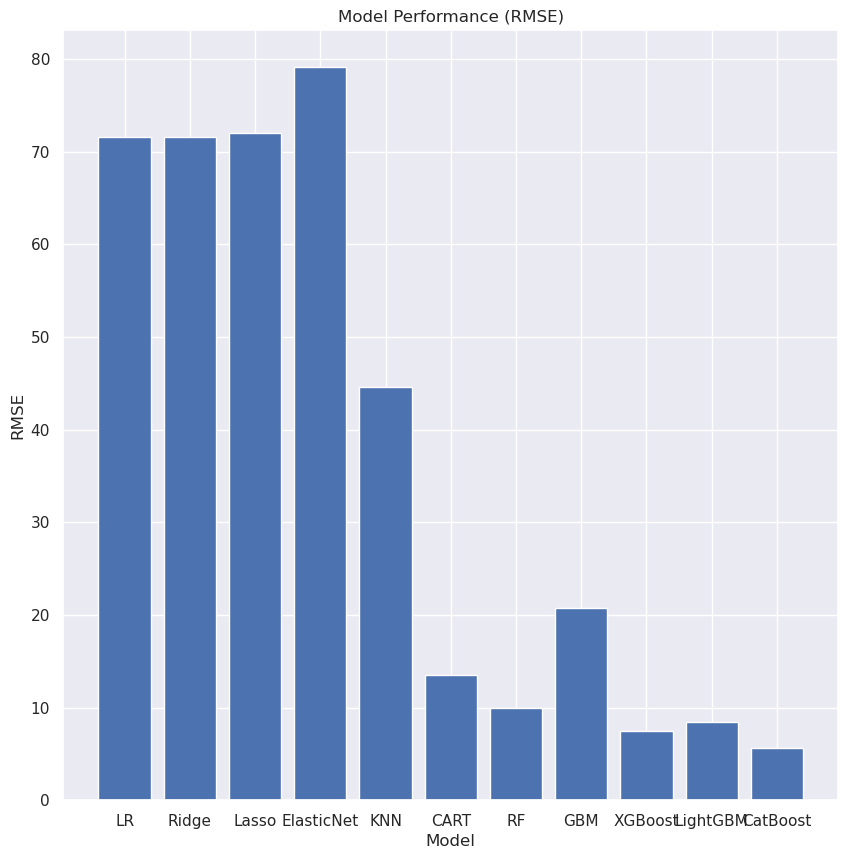

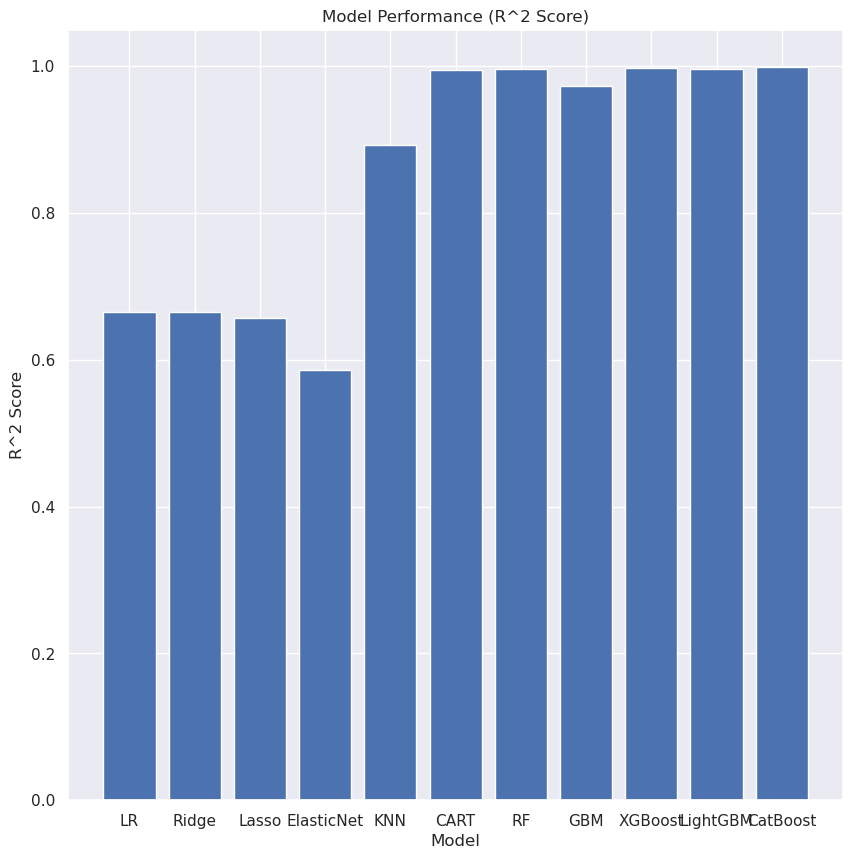

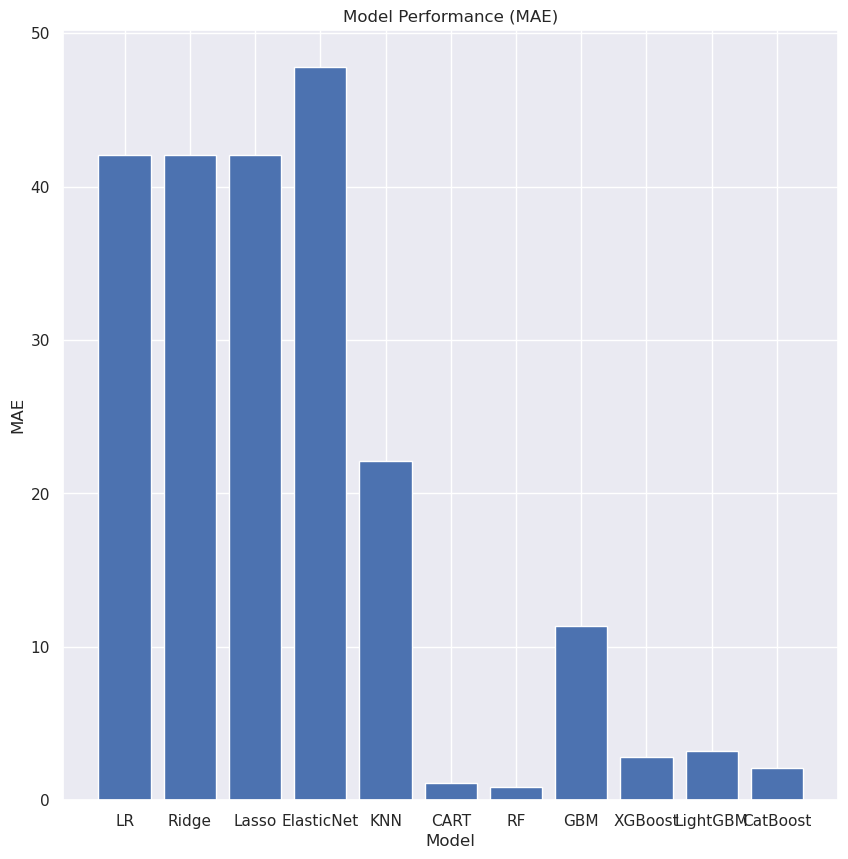

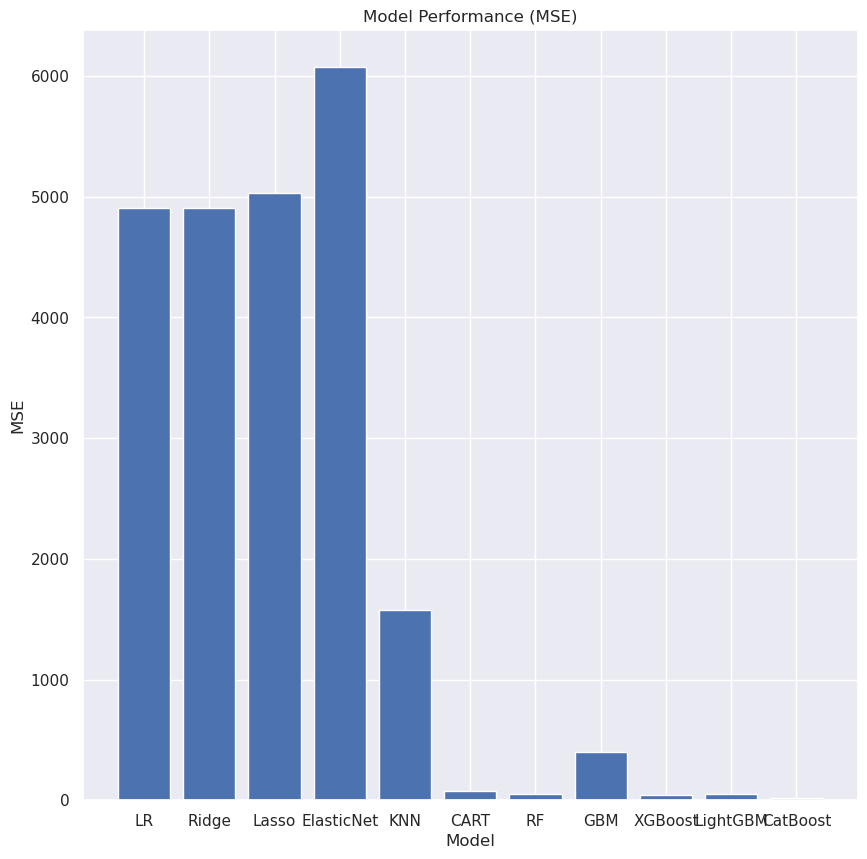

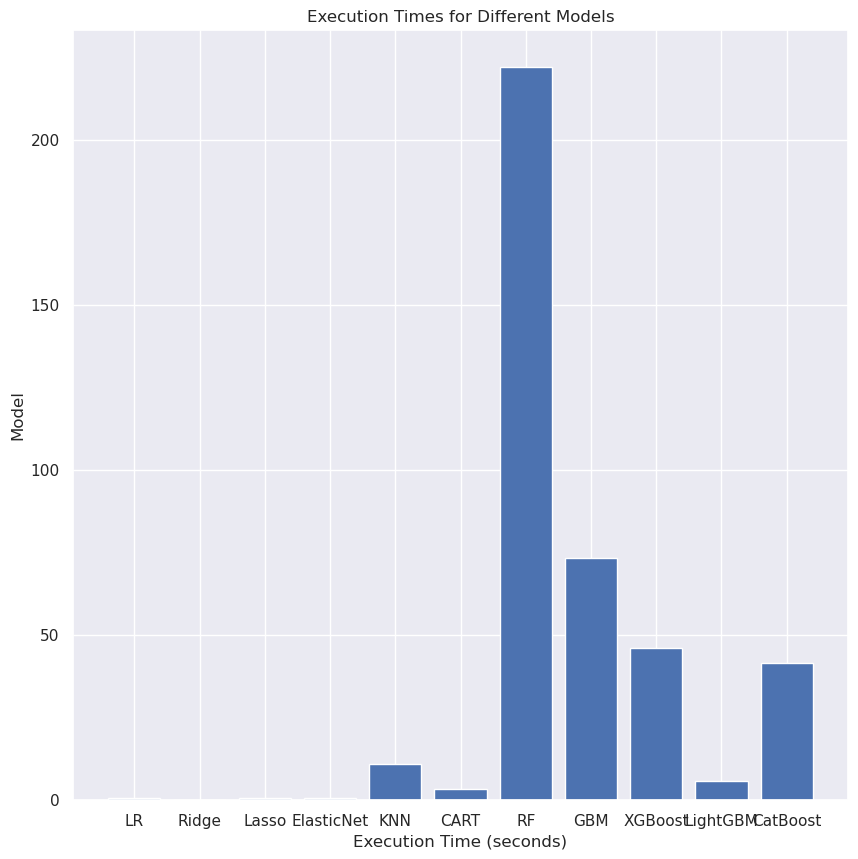

In [97]:
models = [('LR', LinearRegression()),
          ("Ridge", Ridge()),
          ("Lasso", Lasso()),
          ("ElasticNet", ElasticNet()),
          ('KNN', KNeighborsRegressor()),
          ('CART', DecisionTreeRegressor()),
          ('RF', RandomForestRegressor()),
          #('SVR', SVR()),
          ('GBM', GradientBoostingRegressor()),
          ("XGBoost", XGBRegressor(objective='reg:squarederror')),
          ("LightGBM", LGBMRegressor()),
          ("CatBoost", CatBoostRegressor(verbose=False))]

rmse_scores = []
r2_scores = []
mae_scores = []
mse_scores = []
execution_times = []

for name, regressor in models:
    start_time = time.time()

    # Fit the model
    regressor.fit(X_train, y_train)

    # Make predictions
    y_pred = regressor.predict(X_test)

    # Calculate RMSE
    rmse = np.mean(np.sqrt(-cross_val_score(regressor, X, y, cv=5, scoring="neg_mean_squared_error")))
    rmse_scores.append(rmse)
    
    # Calculate R^2 score
    r2 = metrics.r2_score(y_test, y_pred)
    r2_scores.append(r2)

    # Calculate MAE
    mae = metrics.mean_absolute_error(y_test, y_pred)
    mae_scores.append(mae)

    # Calculate MSE
    mse = metrics.mean_squared_error(y_test, y_pred)
    mse_scores.append(mse)

    # Calculate the execution time of the model
    execution_time = time.time() - start_time
    execution_times.append(execution_time)

    print(f"RMSE: {round(rmse, 4)} ({name})")
    print(f"R^2 Score: {round(r2, 4)} ({name})")
    print(f"MAE: {round(mae, 4)} ({name})")
    print(f"MSE: {round(mse, 4)} ({name})")
    print(f"Execution Time: {round(execution_time, 2)} seconds\n")

# Plot RMSE scores
plt.figure(figsize=(10, 10))
plt.bar([name for name, _ in models], rmse_scores)
plt.xlabel("Model")
plt.ylabel("RMSE")
plt.title("Model Performance (RMSE)")
plt.show()

# Plot R^2 scores
plt.figure(figsize=(10, 10))
plt.bar([name for name, _ in models], r2_scores)
plt.xlabel("Model")
plt.ylabel("R^2 Score")
plt.title("Model Performance (R^2 Score)")
plt.show()

# Plot MAE scores
plt.figure(figsize=(10, 10))
plt.bar([name for name, _ in models], mae_scores)
plt.xlabel("Model")
plt.ylabel("MAE")
plt.title("Model Performance (MAE)")
plt.show()

# Plot MSE scores
plt.figure(figsize=(10, 10))
plt.bar([name for name, _ in models], mse_scores)
plt.xlabel("Model")
plt.ylabel("MSE")
plt.title("Model Performance (MSE)")
plt.show()

# Plot execution times
plt.figure(figsize=(10, 10))
plt.bar([name for name, _ in models], execution_times)
plt.xlabel("Execution Time (seconds)")
plt.ylabel("Model")
plt.title("Execution Times for Different Models")
plt.show()

# 21. Hyperparameter optimization

Hyperparameter Tuning for LR:
RMSE: 70.0431 (LR)
R^2 Score: 0.6656 (LR)
MAE: 42.088 (LR)
MSE: 4906.0328 (LR)
Execution Time: 0.04 seconds

Hyperparameter Tuning for Ridge:
Best parameters: {'alpha': 1.0}
RMSE: 70.0438 (Ridge)
R^2 Score: 0.6656 (Ridge)
MAE: 42.0872 (Ridge)
MSE: 4906.1288 (Ridge)
Execution Time: 0.25 seconds

Hyperparameter Tuning for Lasso:
Best parameters: {'alpha': 0.1}
RMSE: 70.1052 (Lasso)
R^2 Score: 0.665 (Lasso)
MAE: 42.0402 (Lasso)
MSE: 4914.7403 (Lasso)
Execution Time: 2.67 seconds

Hyperparameter Tuning for ElasticNet:
Best parameters: {'alpha': 0.1, 'l1_ratio': 0.9}
RMSE: 70.3563 (ElasticNet)
R^2 Score: 0.6626 (ElasticNet)
MAE: 42.0211 (ElasticNet)
MSE: 4950.0056 (ElasticNet)
Execution Time: 6.12 seconds

Hyperparameter Tuning for KNN:
Best parameters: {'n_neighbors': 5}
RMSE: 39.7241 (KNN)
R^2 Score: 0.8924 (KNN)
MAE: 22.0858 (KNN)
MSE: 1578.0056 (KNN)
Execution Time: 14.82 seconds

Hyperparameter Tuning for CART:
Best parameters: {'max_depth': None, 'min_sam

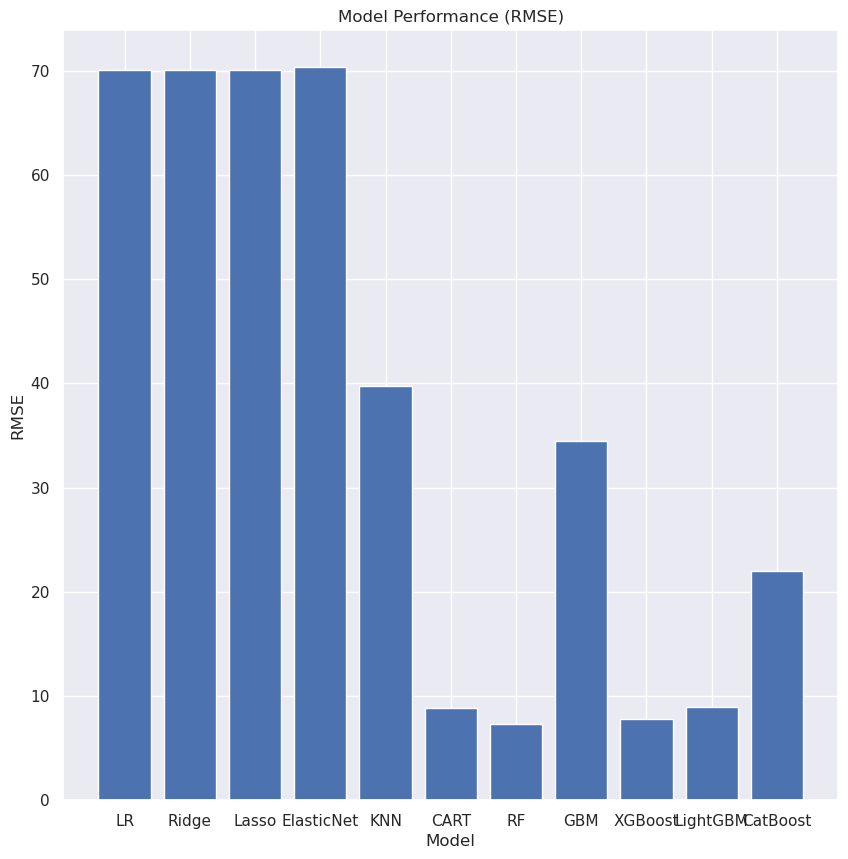

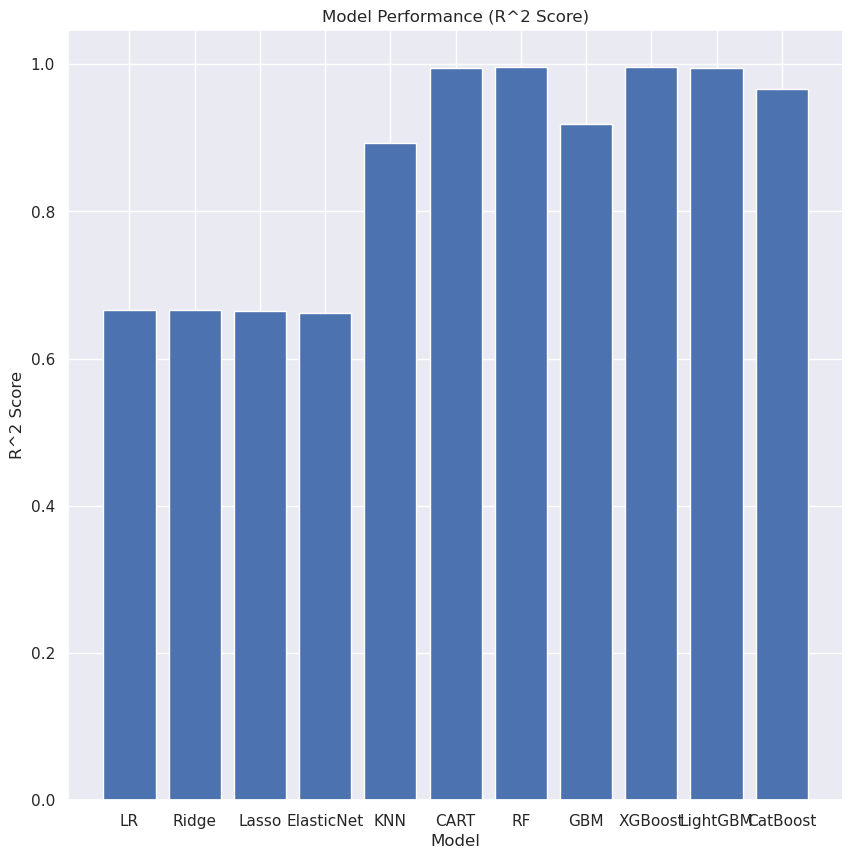

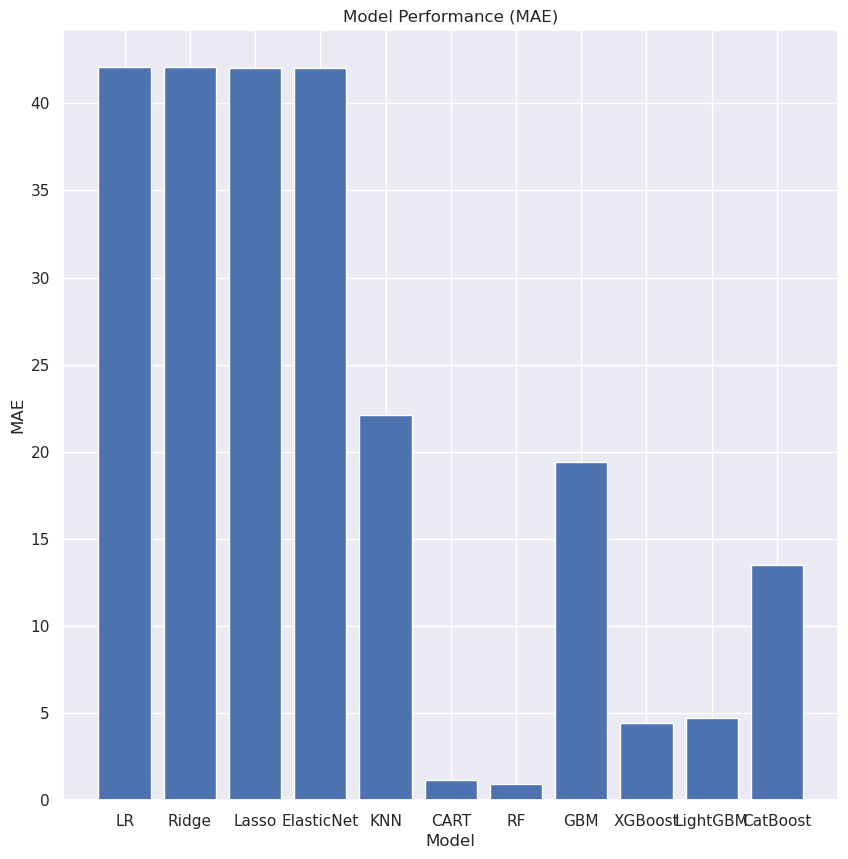

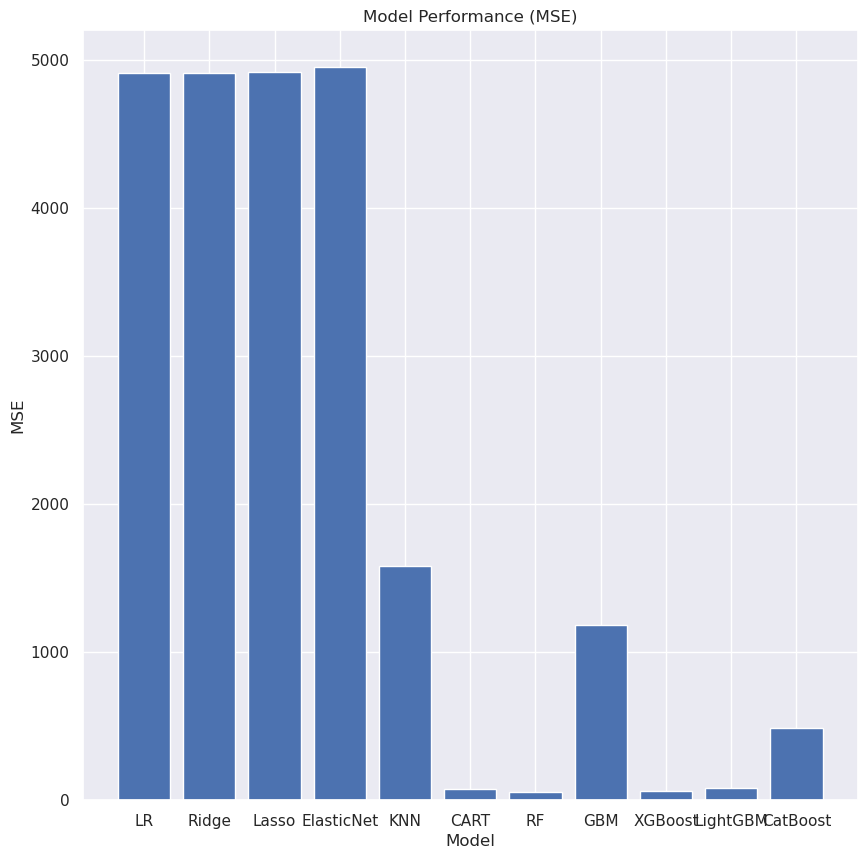

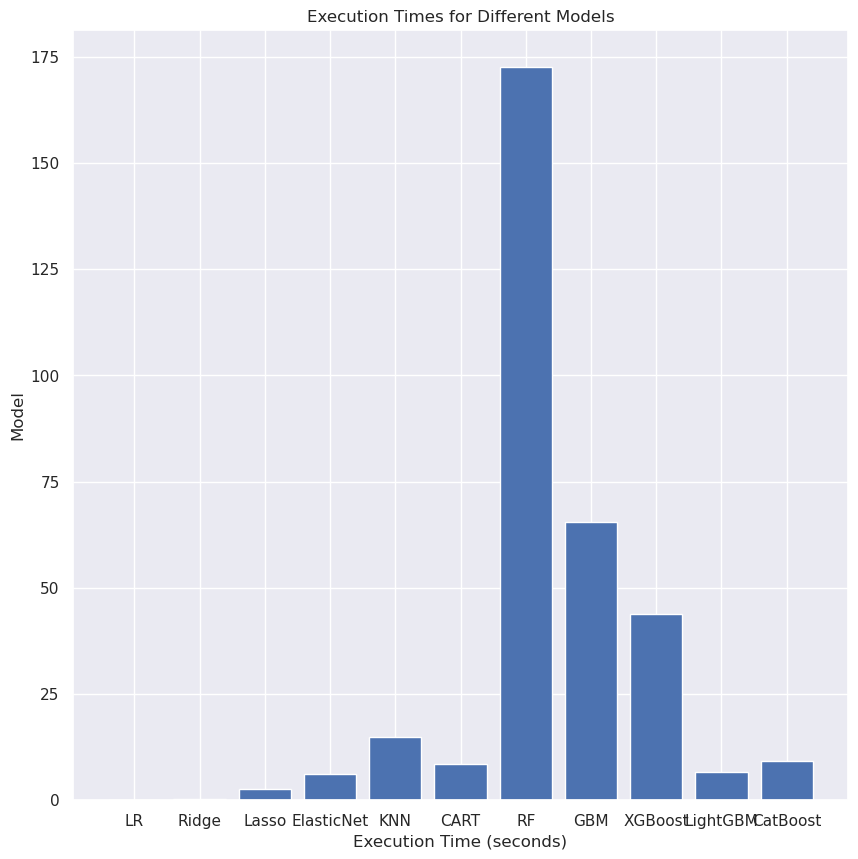

In [98]:
# Initialize the models
models = [('LR', LinearRegression()),
          ("Ridge", Ridge()),
          ("Lasso", Lasso()),
          ("ElasticNet", ElasticNet()),
          ('KNN', KNeighborsRegressor()),
          ('CART', DecisionTreeRegressor()),
          ('RF', RandomForestRegressor()),
          #('SVR', SVR()),
          ('GBM', GradientBoostingRegressor()),
          ("XGBoost", XGBRegressor(objective='reg:squarederror')),
          ("LightGBM", LGBMRegressor()),
          ("CatBoost", CatBoostRegressor(verbose=False))]

# Initialize lists to store metrics
rmse_scores = []
r2_scores = []
mae_scores = []
mse_scores = []
execution_times = []

# Define the hyperparameters for each model
param_grids = {
    'LR': {},
    'Ridge': {'alpha': [0.1, 1.0]},
    'Lasso': {'alpha': [0.1, 1.0]},
    'ElasticNet': {'alpha': [0.1, 1.0], 'l1_ratio': [0.1, 0.9]},
    'KNN': {'n_neighbors': [3, 5]},
    'CART': {'max_depth': [None, 10], 'min_samples_leaf': [1, 2]},
    'RF': {'n_estimators': [10, 50], 'max_depth': [None, 10]},
    'GBM': {'n_estimators': [10, 50], 'learning_rate': [0.01, 0.1]},
    'XGBoost': {'n_estimators': [10, 50], 'learning_rate': [0.01, 0.1]},
    'LightGBM': {'n_estimators': [10, 50], 'learning_rate': [0.01, 0.1]},
    'CatBoost': {'iterations': [10, 50], 'learning_rate': [0.01, 0.1], 'depth': [4, 6]}
}

# Train and evaluate the models with hyperparameter tuning
for name, regressor in models:
    print(f"Hyperparameter Tuning for {name}:")
    start_time = time.time()

    if param_grids[name]:
        grid_search = GridSearchCV(regressor, param_grid=param_grids[name], cv=5, n_jobs=-1)
        grid_search.fit(X_train, y_train)
        best_model = grid_search.best_estimator_

        print(f"Best parameters: {grid_search.best_params_}")
    else:
        best_model = regressor.fit(X_train, y_train)

    # Make predictions
    y_pred = best_model.predict(X_test)

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    rmse_scores.append(rmse)

    # Calculate R^2 score
    r2 = r2_score(y_test, y_pred)
    r2_scores.append(r2)

    # Calculate MAE
    mae = mean_absolute_error(y_test, y_pred)
    mae_scores.append(mae)

    # Calculate MSE
    mse = mean_squared_error(y_test, y_pred)
    mse_scores.append(mse)

    # Calculate the execution time of the model
    execution_time = time.time() - start_time
    execution_times.append(execution_time)

    print(f"RMSE: {round(rmse, 4)} ({name})")
    print(f"R^2 Score: {round(r2, 4)} ({name})")
    print(f"MAE: {round(mae, 4)} ({name})")
    print(f"MSE: {round(mse, 4)} ({name})")
    print(f"Execution Time: {round(execution_time, 2)} seconds\n")

# Plot RMSE scores
plt.figure(figsize=(10, 10))
plt.bar([name for name, _ in models], rmse_scores)
plt.xlabel("Model")
plt.ylabel("RMSE")
plt.title("Model Performance (RMSE)")
plt.show()

# Plot R^2 scores
plt.figure(figsize=(10, 10))
plt.bar([name for name, _ in models], r2_scores)
plt.xlabel("Model")
plt.ylabel("R^2 Score")
plt.title("Model Performance (R^2 Score)")
plt.show()

# Plot MAE scores
plt.figure(figsize=(10, 10))
plt.bar([name for name, _ in models], mae_scores)
plt.xlabel("Model")
plt.ylabel("MAE")
plt.title("Model Performance (MAE)")
plt.show()

# Plot MSE scores
plt.figure(figsize=(10, 10))
plt.bar([name for name, _ in models], mse_scores)
plt.xlabel("Model")
plt.ylabel("MSE")
plt.title("Model Performance (MSE)")
plt.show()

# Plot execution times
plt.figure(figsize=(10, 10))
plt.bar([name for name, _ in models], execution_times)
plt.xlabel("Execution Time (seconds)")
plt.ylabel("Model")
plt.title("Execution Times for Different Models")
plt.show()

# 22. Final Model Predictions and Comparison with True Prices

In [99]:
best_model

In [100]:
# Final Prediction Model
final_model = best_model

# Make predictions on the test set using the final model
y_final_pred = final_model.predict(X_test)
final_y_pred = (y_final_pred)
final_y_test =(y_test)

In [101]:
# Create a DataFrame with the predicted prices and true prices
results = pd.DataFrame({'Predicted Price': final_y_pred, 'True Price': final_y_test})

# Calculate the difference between the true prices and predicted prices and add a new column
results['Difference'] = results['True Price'] - results['Predicted Price']

# Display the results
print(results)

       Predicted Price  True Price  Difference
2472           126.326     135.000       8.674
34556           92.806     100.000       7.194
34771           45.922      39.000      -6.922
48617           69.104      80.000      10.896
11574          150.728     150.000      -0.728
...                ...         ...         ...
24079          418.112     375.000     -43.112
39454          124.731     120.000      -4.731
12582          191.450     220.000      28.550
10308          147.850     200.000      52.150
6586            72.761      80.000       7.239

[9779 rows x 3 columns]


# 23. Feature Importance

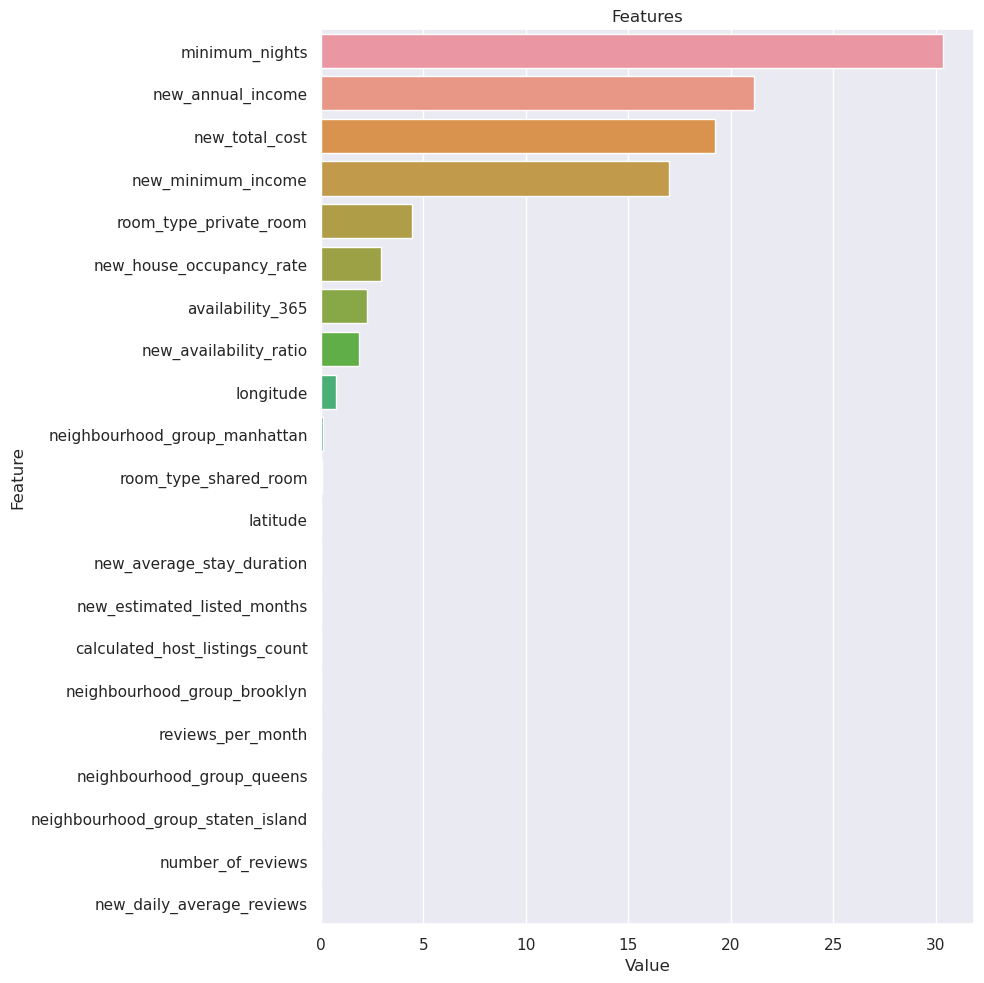

In [102]:
def plot_importance(model, features, num=50, save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value",
                                                                     ascending=False)[0:num])
    plt.title('Features')
    plt.tight_layout()
    plt.show(block=True)
    if save:
        plt.savefig('importances.png')

plot_importance(final_model, X)